_Author: Piotr Kaniewski_
# SILC scores stability analysis 
This notebook is a quick analysis of the SILC scores and the distribution of scores for a specific disease. Node2Vec model has proven to outperform graphsage for our matrix task but when it comes to specific diseases, the performance of GraphSAGE is much better. 

This brings up another question for node2vec - is that a 'trend' which we could observe for other sparse subgraphs? While some diseases (ASD, breast cancer) will definitely have dense subgraphs, other diseases (time agnosia, rare diseases) will have sparse subgraphs due to little knowledge. It would be interesting to see if this is a 'trend' or a 'one-off' case (and if it is a trend and we decide to continue with SILC project, we should focus on improving the SILC model for sparse subgraphs or expanding SILC subgraph in general)

For full notebook see [here](https://github.com/everycure-org/lab-notebooks/pull/27)

# Distribution of full matrix scores and silc scores - node2vec

In [2]:
import polars as pl 
import seaborn as sns
import matplotlib.pyplot as plt
from neo4j import GraphDatabase
import igraph as ig
import pandas as pd 
import numpy as np

In [3]:
# SILC predictions 
matrix_scores = pd.read_parquet('gs://mtrx-us-central1-hub-dev-storage/archive/runs/run-node2vec-iter10/07_model_output/xg_ensemble/matrix_predictions')
silc_full = pd.read_excel(f'../scratch/silc_november/old_release_cumulative_subtypes_silc_node2vec.xlsx')


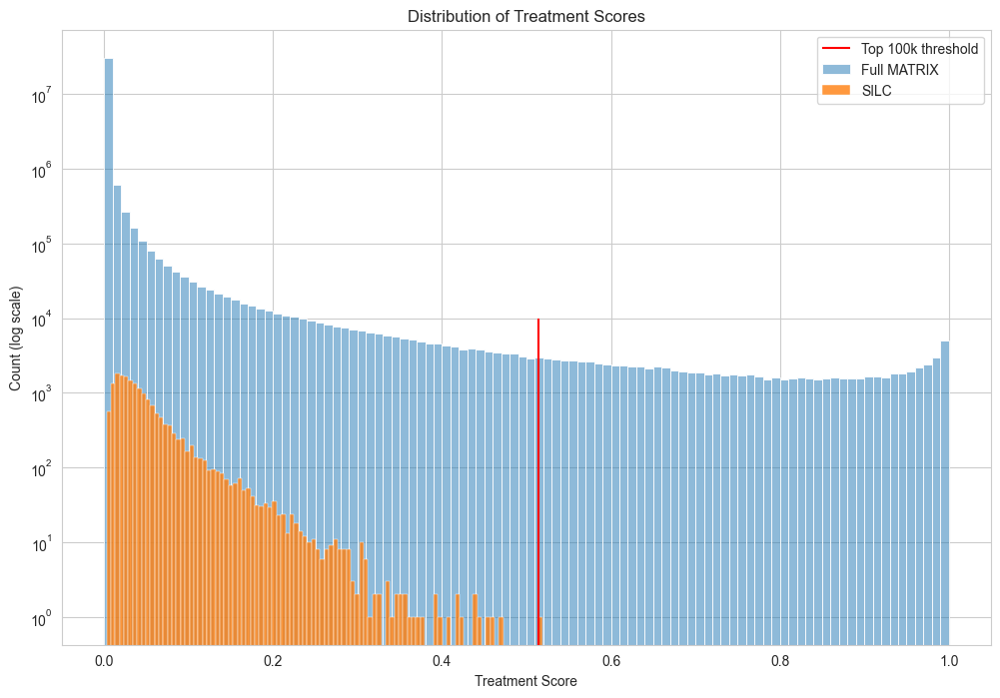

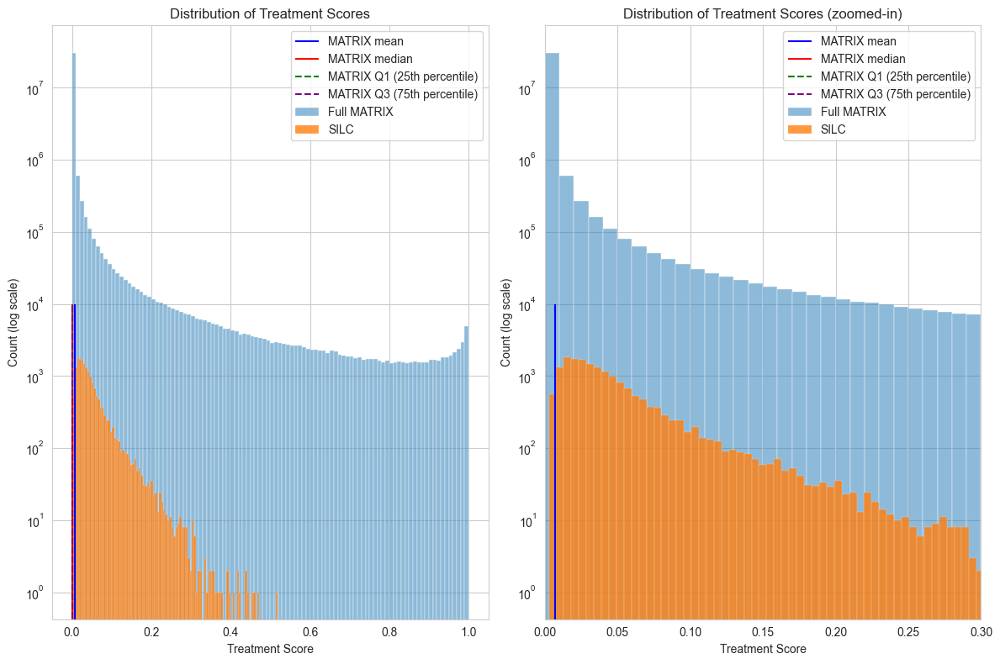

In [3]:

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=silc_full, x='treat_score', bins=100, label='SILC', alpha=0.8)
plt.vlines(matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=silc_full, x='treat_score', bins=100, label='SILC', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=silc_full, x='treat_score', bins=100, label='SILC', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

Although SILC scores are lower and not as consistent with overall SILC distribution, the scores are much better than they are for an average disease and they are almost within top100k scores threshold. 

# Examine density of the graph and local neighborhoods of SILC

Below I want to make a quick qualitative analysis which examines if treat scores for a specific disease are correlated with this diseases density/degree. Then I will compare how those scores compare with GraphSAGE

In [73]:
# get degree from neo4j once calculated; do that for any rtx-kg 2.7.3

uri = "bolt://localhost:7687"
driver = GraphDatabase.driver(uri, auth=("neo4j", "admin"), database="everycure-feature-fixes-v7")

query = "match (n) return n.id as id, n.name as name, n.category as embeddings, n.degree as degree"

with driver.session() as session:
    result = session.run(query)
    nodes = [record for record in result]   
    # Convert nodes to a DataFrame
    df = pd.DataFrame(nodes)

    df.to_csv('kg_degree_nodes.csv', index=False) #head()


df.columns = ['id', 'name', 'category', 'degree']



In [75]:
# read disease list
disease_list = pd.read_csv('gs://mtrx-us-central1-hub-dev-storage/kedro/data/01_raw/disease_list/arax/latest/disease_list.tsv', sep='\t')

In [76]:
# Merge matrix scores with degree information to know which diseases have highest/lowest degrees
df = (matrix_scores.groupby('target')
             .agg({'treat score': ['min', 'max', 'mean']})
             .merge(df[['id', 'degree']].rename(columns={'id': 'target'}), 
                   on='target', 
                   how='left'))

df.sort_values(('treat score', 'min'), ascending=False)


/var/folders/8k/ct7ltxz14k37shrv70134t1c0000gp/T/ipykernel_2025/4035770482.py:4: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  .merge(df[['id', 'degree']].rename(columns={'id': 'target'}),


,target,"(treat score, min)","(treat score, max)","(treat score, mean)",degree
1203,MONDO:0002520,1.015677e-04,0.998079,1.183883e-01,120
12542,MONDO:0018301,9.468899e-05,0.991826,1.855991e-01,119
2712,MONDO:0005361,7.082280e-05,0.999950,9.648965e-02,150
8355,MONDO:0012451,7.013605e-05,0.964273,6.852572e-02,286
3823,MONDO:0007275,6.285582e-05,0.997554,6.863089e-02,122
...,...,...,...,...,...
159,MONDO:0000545,1.529977e-11,0.000505,1.346164e-06,4
9440,MONDO:0013697,1.309143e-11,0.017014,1.182476e-05,4
9445,MONDO:0013703,9.818708e-12,0.002370,2.763770e-06,6
11999,MONDO:0017443,9.364360e-12,0.000005,3.419353e-08,7


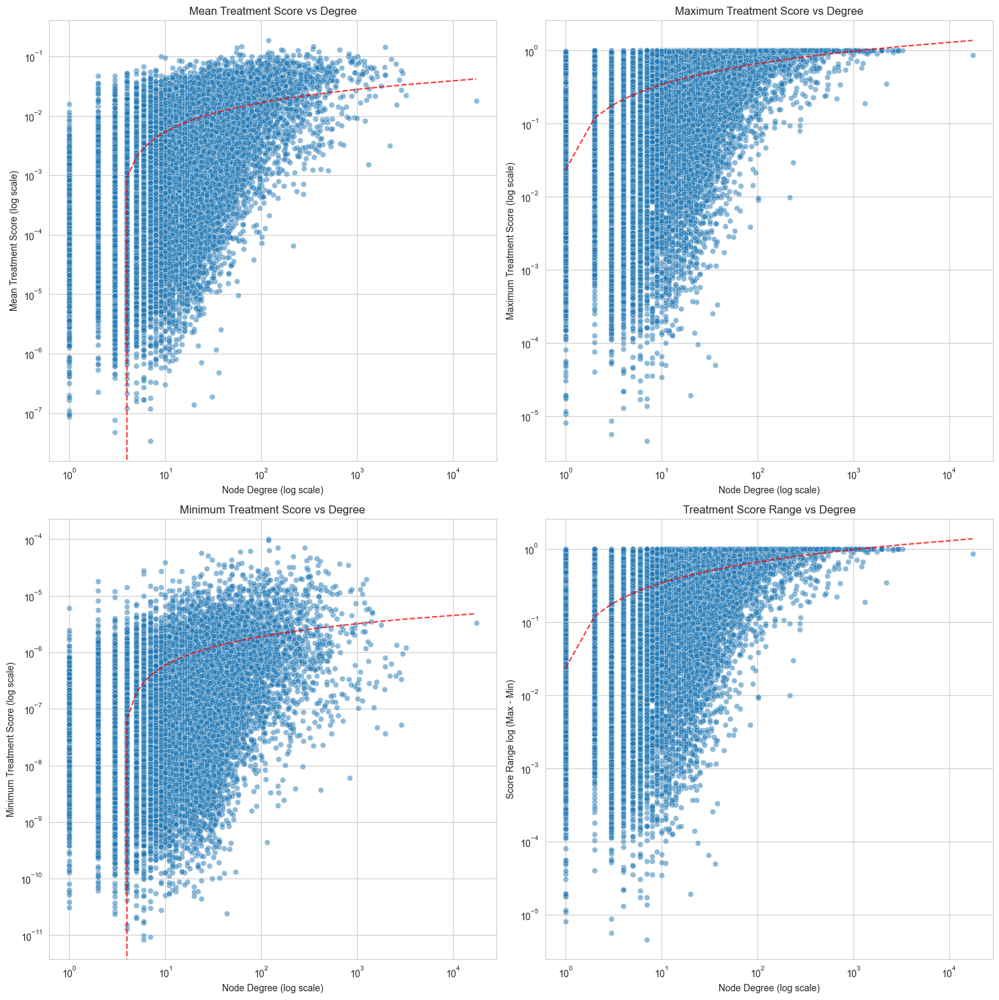

In [77]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
sns.set_style('whitegrid')

# Plot 1: Mean Score vs Degree
sns.scatterplot(data=df, x='degree', y=('treat score', 'mean'), alpha=0.5, ax=axes[0,0])
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_title('Mean Treatment Score vs Degree')
axes[0,0].set_xlabel('Node Degree (log scale)')
axes[0,0].set_ylabel('Mean Treatment Score (log scale)')

# Plot 2: Max Score vs Degree
sns.scatterplot(data=df, x='degree', y=('treat score', 'max'), alpha=0.5, ax=axes[0,1])
axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')
axes[0,1].set_title('Maximum Treatment Score vs Degree')
axes[0,1].set_xlabel('Node Degree (log scale)')
axes[0,1].set_ylabel('Maximum Treatment Score (log scale)')

# Plot 3: Min Score vs Degree
sns.scatterplot(data=df, x='degree', y=('treat score', 'min'), alpha=0.5, ax=axes[1,0])
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_title('Minimum Treatment Score vs Degree')
axes[1,0].set_xlabel('Node Degree (log scale)')
axes[1,0].set_ylabel('Minimum Treatment Score (log scale)')

# Plot 4: Score Range (Max-Min) vs Degree
df['score_range'] = df[('treat score', 'max')] - df[('treat score', 'min')]
sns.scatterplot(data=df, x='degree', y='score_range', alpha=0.5, ax=axes[1,1])
axes[1,1].set_xscale('log')
axes[1,1].set_yscale('log')
axes[1,1].set_title('Treatment Score Range vs Degree')
axes[1,1].set_xlabel('Node Degree (log scale)')
axes[1,1].set_ylabel('Score Range log (Max - Min)')

plt.tight_layout()

# Optional: Add trend lines
for i in range(2):
    for j in range(2):
        if i == 1 and j == 1:
            y = df['score_range']
        else:
            y = df[('treat score', ['mean', 'max', 'min'][i*2 + j])]
        x = df['degree']
        z = np.polyfit(np.log10(x), y, 1)
        p = np.poly1d(z)
        axes[i,j].plot(sorted(x), p(np.log10(sorted(x))), "r--", alpha=0.8)

Text(0.5, 0, 'Degree Percentile Bin')

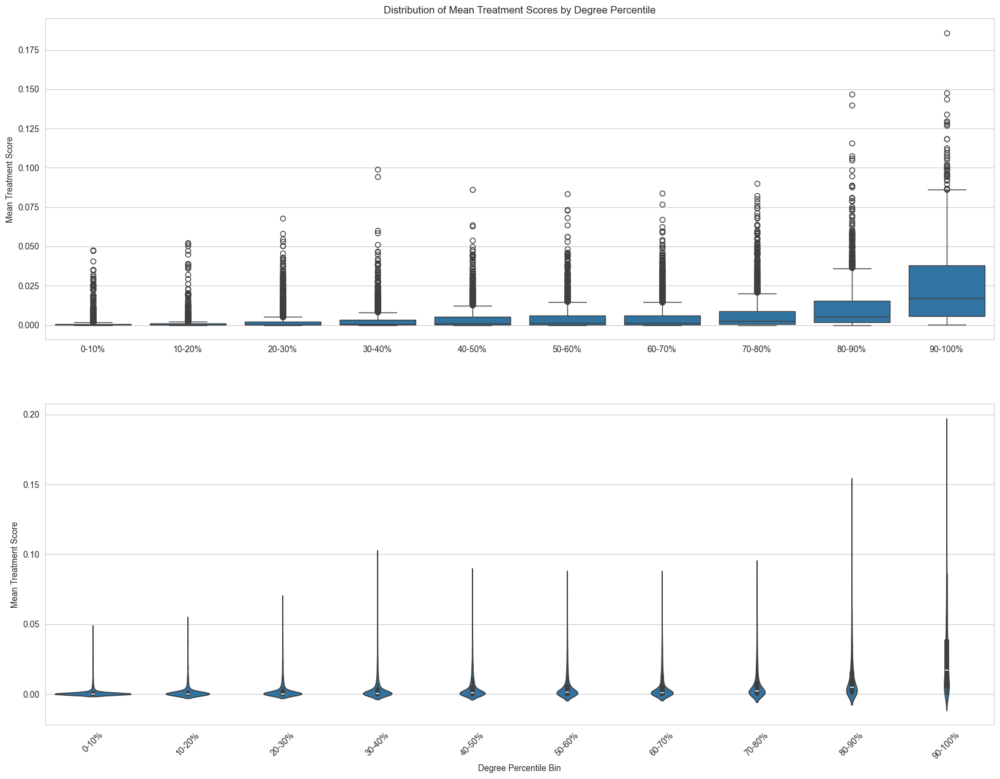

In [78]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df['degree_bin'] = pd.qcut(df['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

plt.title('Distribution of Mean Treatment Scores by Degree Percentile')
sns.boxplot(data=df, x='degree_bin', y=('treat score', 'mean'))
plt.xlabel('')
plt.ylabel('Mean Treatment Score')
plt.subplot(2,1,2)
sns.violinplot(data=df, x='degree_bin', y=('treat score', 'mean'))
plt.xticks(rotation=45)
plt.ylabel('Mean Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

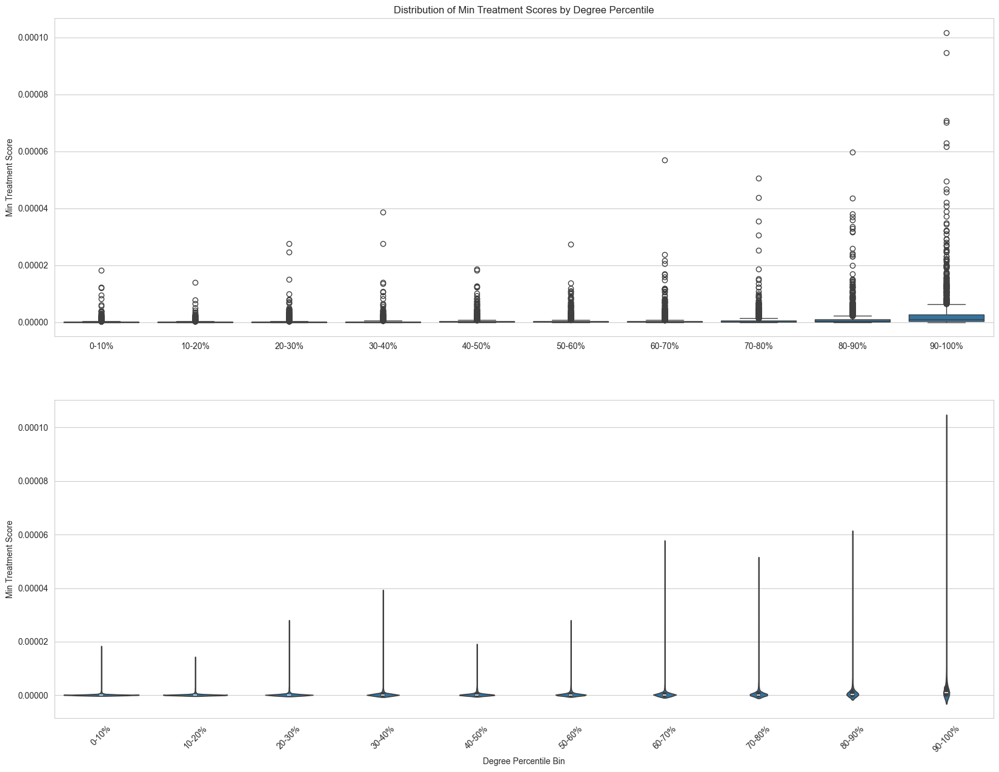

In [79]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df['degree_bin'] = pd.qcut(df['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])
plt.title('Distribution of Min Treatment Scores by Degree Percentile')
sns.boxplot(data=df, x='degree_bin', y=('treat score', 'min'))
plt.ylabel('Min Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df, x='degree_bin', y=('treat score', 'min'))
plt.xticks(rotation=45)
plt.ylabel('Min Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

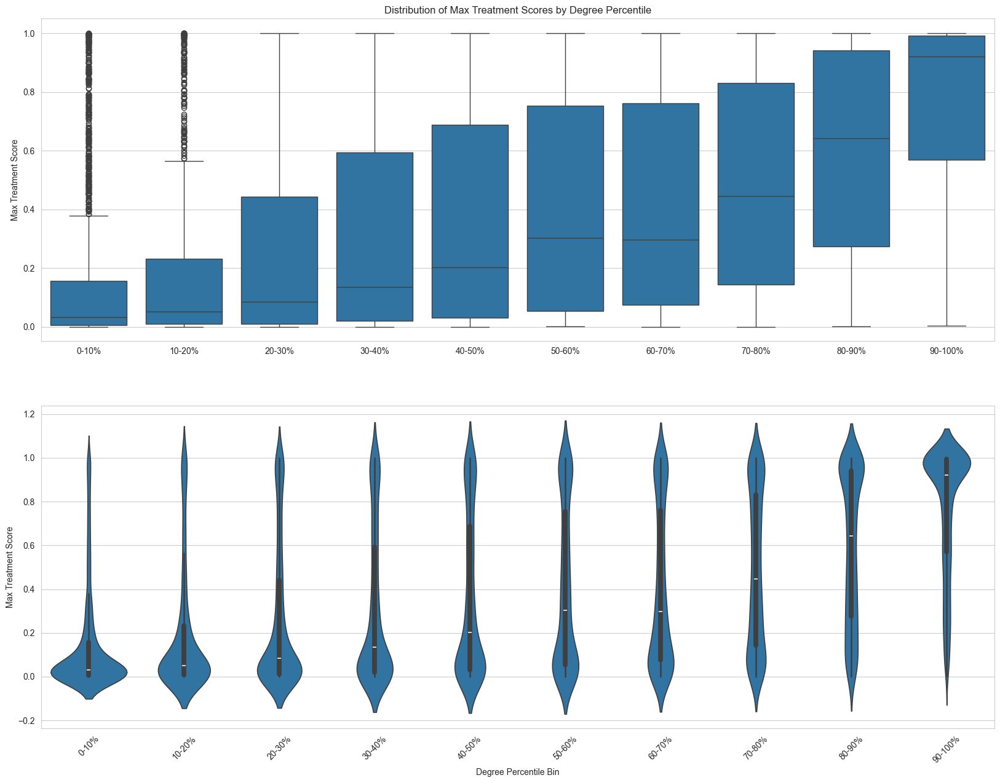

In [80]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df['degree_bin'] = pd.qcut(df['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])
plt.title('Distribution of Max Treatment Scores by Degree Percentile')
sns.boxplot(data=df, x='degree_bin', y=('treat score', 'max'))
plt.ylabel('Max Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df, x='degree_bin', y=('treat score', 'max'))
plt.xticks(rotation=45)
plt.ylabel('Max Treatment Score')
plt.xlabel('Degree Percentile Bin')


## Specific cases
These cases were selected on degree basis - the idea is to see whether diseases with sparse graphs/low degree have lower scores (which is likely)

### SILC

In [4]:
df = pl.read_parquet('gs://mtrx-us-central1-hub-dev-storage/archive/runs/run-evaluation-redesign-v2/03_primary/unified/edges/')
out_neighbours = df.filter(pl.col('subject').str.contains('EC:|DOID:0080848'))


In [6]:
# Create vertex list from unique subjects and objects
vertices = pl.concat([df['subject'], df['object']]).unique().to_list()

# Create edge list from subject-object pairs
edges = list(zip(df['subject'].to_list(), df['object'].to_list()))

# Create directed graph
g = ig.Graph(directed=True)

# Add vertices and edges
g.add_vertices(vertices)
g.add_edges(edges)


subtype_names = [node_name for node_name in g.vs['name'] if ('EC:' in node_name)|('DOID_0080848' in node_name)]
subtype_ids = [g.vs.find(name=name).index for name in subtype_names]

N = 0
two_hop_neighbours_size_old = []
three_hop_neighbours_size_old = []
for N in range(len(subtype_ids)):
    # Get first hop neighbors
    first_hop = g.neighbors(subtype_ids[N])

    # Get second hop neighbors
    second_hop = []
    for neighbor in first_hop:
        second_hop.extend(g.neighbors(neighbor))

    all_neighbors = list(set(first_hop + second_hop))
    two_hop_neighbours_size_old.append(len(all_neighbors))
    # Get third hop neighbors
    third_hop=[]
    for neighbor in second_hop:
        third_hop.extend(g.neighbors(neighbor))
    all_neighbors = list(set(first_hop + second_hop + third_hop))
    three_hop_neighbours_size_old.append(len(all_neighbors))

size_dict_2_hop_old = {subtype_names[i]: two_hop_neighbours_size_old[i] for i in range(len(subtype_names))}
size_dict_3_hop_old = {subtype_names[i]: three_hop_neighbours_size_old[i] for i in range(len(subtype_names))}



In [7]:

degree_metrics = {}
for subtype_name, subtype_id in zip(subtype_names, subtype_ids):
    # Get multi-hop neighbors
    first_hop = set(g.neighbors(subtype_id))
    second_hop = set()
    for neighbor in first_hop:
        second_hop.update(g.neighbors(neighbor))
    second_hop = second_hop - first_hop  # Remove overlap with first hop
    
    third_hop = set()
    for neighbor in second_hop:
        third_hop.update(g.neighbors(neighbor))
    third_hop = third_hop - first_hop - second_hop  # Remove overlap with previous hops

    degree_metrics[subtype_name] = {
        'in_degree': g.degree(subtype_id, mode='in'),
        'out_degree': g.degree(subtype_id, mode='out'),
        'total_degree': g.degree(subtype_id, mode='all'),
        'local_density_1hop': len(first_hop) / (len(vertices) - 1),
        'local_density_2hop': len(first_hop | second_hop) / (len(vertices) - 1),
        'local_density_3hop': len(first_hop | second_hop | third_hop) / (len(vertices) - 1),
        'n_1hop_neighbors': len(first_hop),
        'n_2hop_neighbors': len(second_hop),
        'n_3hop_neighbors': len(third_hop),
        'cumulative_2hop': len(first_hop | second_hop),
        'cumulative_3hop': len(first_hop | second_hop | third_hop)
    }

# Calculate average metrics across all subtypes
avg_metrics = {
    metric: np.mean([v[metric] for v in degree_metrics.values()])
    for metric in next(iter(degree_metrics.values())).keys()
}

In [8]:
degree_metrics

{'EC:6': {'in_degree': 0,
  'out_degree': 8,
  'total_degree': 8,
  'local_density_1hop': 2.1859661519536118e-06,
  'local_density_2hop': 0.00015766280870965424,
  'local_density_3hop': 0.06165025689200972,
  'n_1hop_neighbors': 8,
  'n_2hop_neighbors': 569,
  'n_3hop_neighbors': 225045,
  'cumulative_2hop': 577,
  'cumulative_3hop': 225622},
 'EC:5': {'in_degree': 0,
  'out_degree': 8,
  'total_degree': 8,
  'local_density_1hop': 2.1859661519536118e-06,
  'local_density_2hop': 0.00019263826714091203,
  'local_density_3hop': 0.06387147174816359,
  'n_1hop_neighbors': 8,
  'n_2hop_neighbors': 697,
  'n_3hop_neighbors': 233046,
  'cumulative_2hop': 705,
  'cumulative_3hop': 233751},
 'EC:2': {'in_degree': 0,
  'out_degree': 6,
  'total_degree': 6,
  'local_density_1hop': 1.6394746139652087e-06,
  'local_density_2hop': 6.393950994464314e-05,
  'local_density_3hop': 0.009839033649943206,
  'n_1hop_neighbors': 6,
  'n_2hop_neighbors': 228,
  'n_3hop_neighbors': 35774,
  'cumulative_2hop': 2

### ASD Example

In [9]:
# Compare now with ASD 
out_neighbours = df.filter(pl.col('subject').str.contains('MONDO:0005258'))


In [10]:
# Create vertex list from unique subjects and objects
vertices = pl.concat([df['subject'], df['object']]).unique().to_list()

# Create edge list from subject-object pairs
edges = list(zip(df['subject'].to_list(), df['object'].to_list()))

# Create directed graph
g = ig.Graph(directed=True)

# Add vertices and edges
g.add_vertices(vertices)
g.add_edges(edges)


subtype_names = ['MONDO:0005258']
subtype_ids = [g.vs.find(name=name).index for name in subtype_names]

N = 0
two_hop_neighbours_size_old = []
three_hop_neighbours_size_old = []
for N in range(len(subtype_ids)):
    # Get first hop neighbors
    first_hop = g.neighbors(subtype_ids[N])

    # Get second hop neighbors
    second_hop = []
    for neighbor in first_hop:
        second_hop.extend(g.neighbors(neighbor))

    all_neighbors = list(set(first_hop + second_hop))
    two_hop_neighbours_size_old.append(len(all_neighbors))
    # Get third hop neighbors

size_dict_2_hop_old = {subtype_names[i]: two_hop_neighbours_size_old[i] for i in range(len(subtype_names))}



In [11]:
# note that 3hop here is killing my kernel so that's already a sign it's not sparse
degree_metrics = {}
for subtype_name, subtype_id in zip(subtype_names, subtype_ids):
    # Get multi-hop neighbors
    first_hop = set(g.neighbors(subtype_id))
    second_hop = set()
    for neighbor in first_hop:
        second_hop.update(g.neighbors(neighbor))
    second_hop = second_hop - first_hop  # Remove overlap with first hop

    degree_metrics[subtype_name] = {
        'in_degree': g.degree(subtype_id, mode='in'),
        'out_degree': g.degree(subtype_id, mode='out'),
        'total_degree': g.degree(subtype_id, mode='all'),
        'local_density_1hop': len(first_hop) / (len(vertices) - 1),
        'local_density_2hop': len(first_hop | second_hop) / (len(vertices) - 1),
        'n_1hop_neighbors': len(first_hop),
        'n_2hop_neighbors': len(second_hop),
        'cumulative_2hop': len(first_hop | second_hop),
    }

# Calculate average metrics across all subtypes
avg_metrics = {
    metric: np.mean([v[metric] for v in degree_metrics.values()])
    for metric in next(iter(degree_metrics.values())).keys()
}

In [12]:
avg_metrics

{'in_degree': 1770.0,
 'out_degree': 181.0,
 'total_degree': 1951.0,
 'local_density_1hop': 0.000499220019952406,
 'local_density_2hop': 0.03742018832644891,
 'n_1hop_neighbors': 1827.0,
 'n_2hop_neighbors': 135120.0,
 'cumulative_2hop': 136947.0}

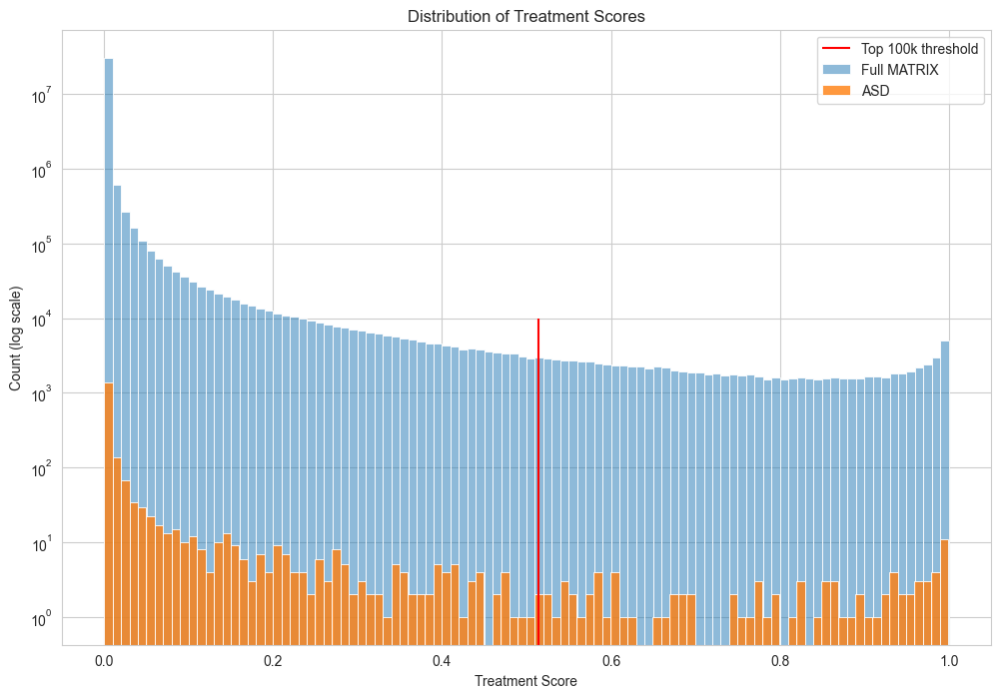

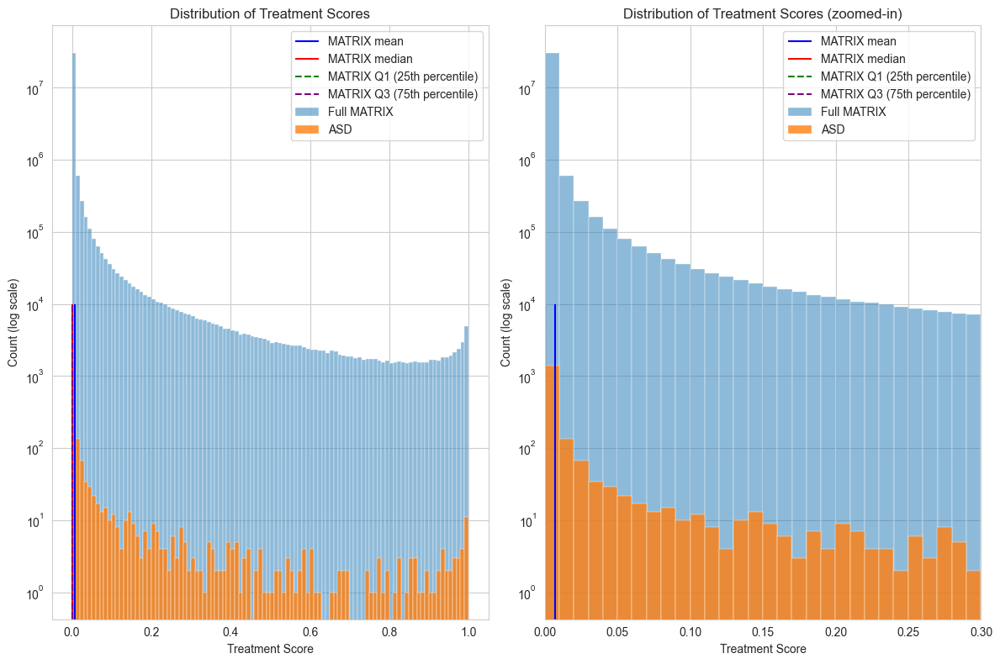

In [14]:
# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='ASD', alpha=0.8)
plt.vlines(matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='ASD', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='ASD', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

### Time Agnosia Example MONDO:0000682

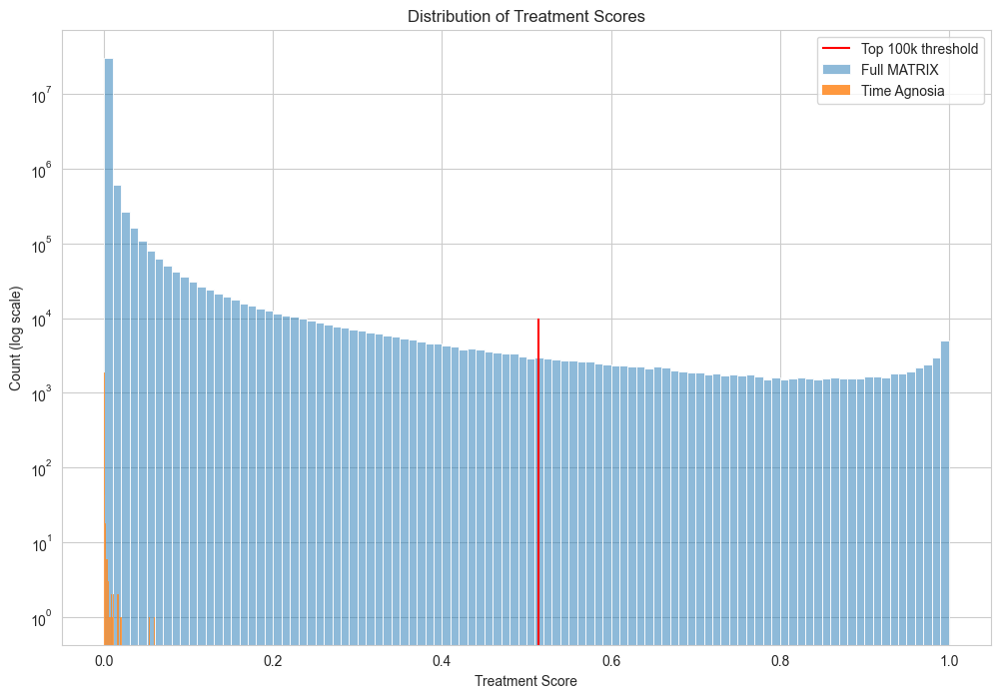

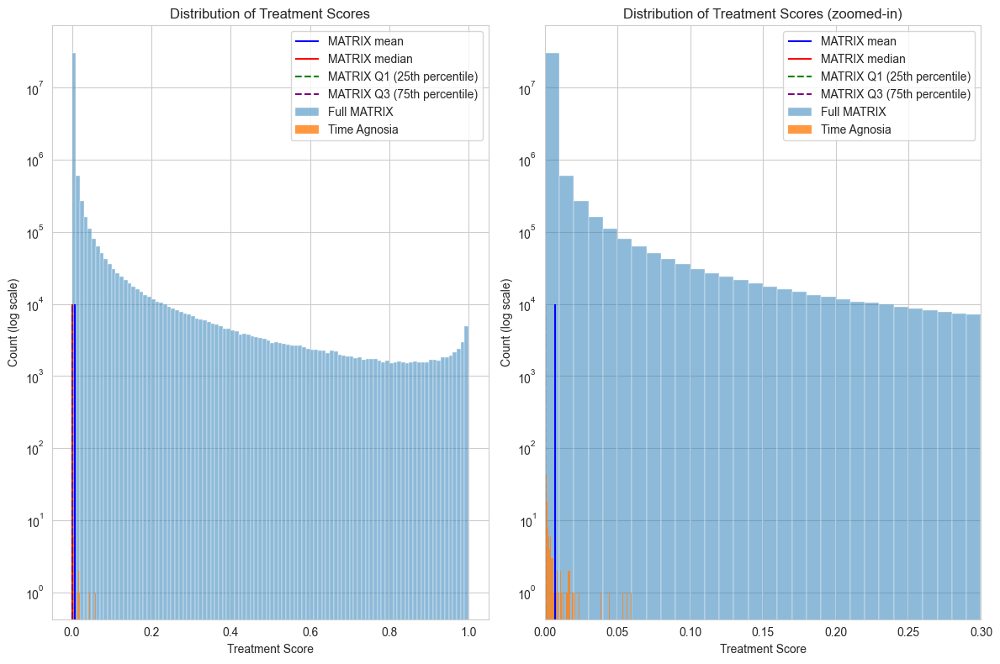

In [29]:

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0000682'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0000682'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0000682'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

### MONDO:0011305

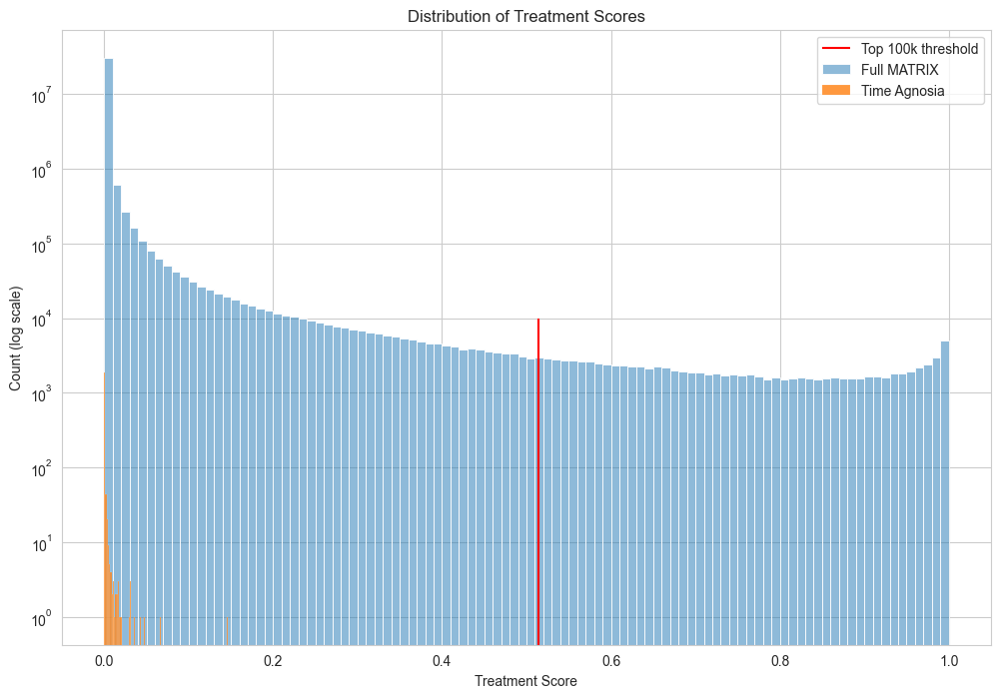

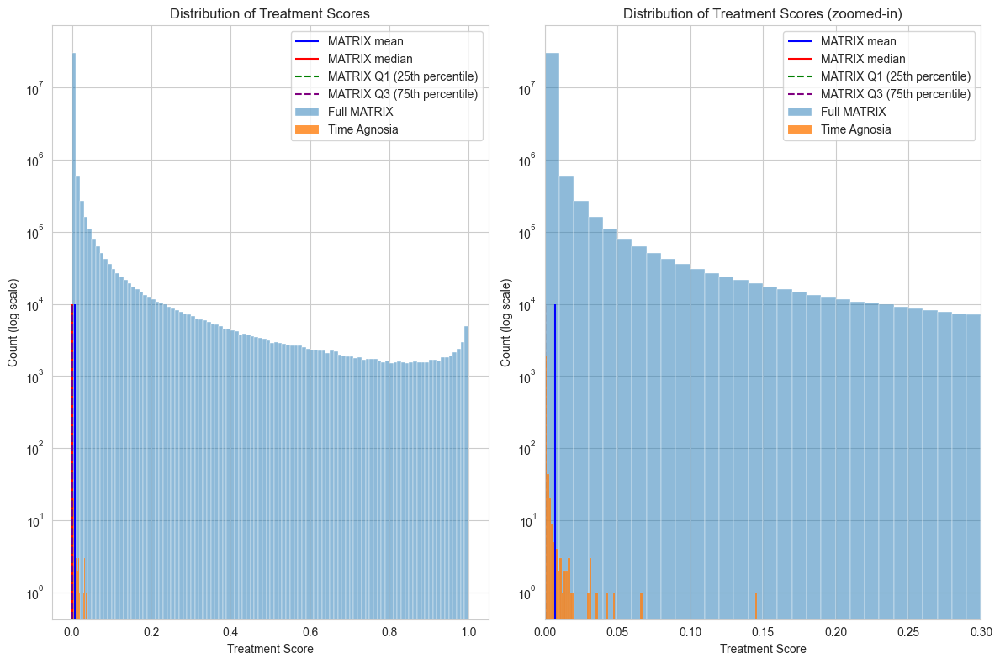

In [36]:

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

### Malignant Melanoma MONDO:0015694

In [ ]:
import numpy as np
degree_metrics = {}
for subtype_name, subtype_id in zip(subtype_names, subtype_ids):
    # Get multi-hop neighbors
    first_hop = set(g.neighbors(subtype_id))
    second_hop = set()
    for neighbor in first_hop:
        second_hop.update(g.neighbors(neighbor))
    second_hop = second_hop - first_hop  # Remove overlap with first hop

    degree_metrics[subtype_name] = {
        'in_degree': g.degree(subtype_id, mode='in'),
        'out_degree': g.degree(subtype_id, mode='out'),
        'total_degree': g.degree(subtype_id, mode='all'),
        'local_density_1hop': len(first_hop) / (len(vertices) - 1),
        'local_density_2hop': len(first_hop | second_hop) / (len(vertices) - 1),
        'n_1hop_neighbors': len(first_hop),
        'n_2hop_neighbors': len(second_hop),
        'cumulative_2hop': len(first_hop | second_hop),
    }

degree_metrics

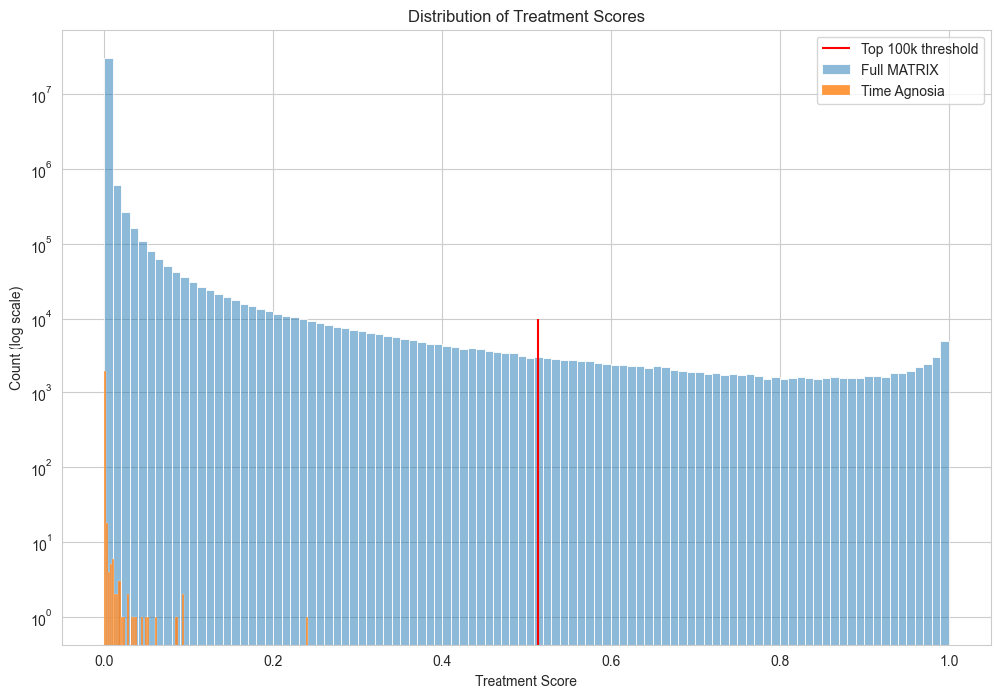

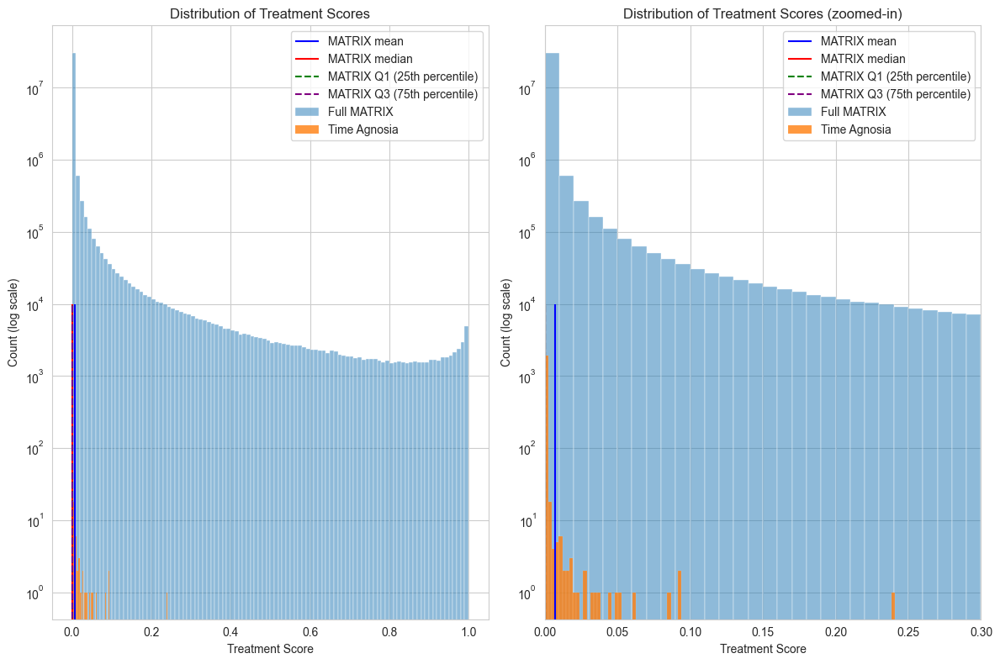

In [33]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = matrix_scores['treat score'].quantile(0.25)
q75 = matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='MATRIX mean')
plt.vlines(matrix_scores['treat score'].median(), 0, 10000, color='red', label='MATRIX median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='MATRIX Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

# GraphSAGE comparison
As GraphSAGE proved to give better scores for SILC, it's possible that GRaphSAGE does a better job with frequent losers

In [82]:
gs_matrix_scores = pd.read_parquet('gs://mtrx-us-central1-hub-dev-storage/archive/runs/full_matrix_run/07_model_output/xg_ensemble/matrix_predictions')
# SILC predictions

In [11]:
# Merge matrix scores with degree information
df_gs = (gs_matrix_scores.groupby('target')
             .agg({'treat score': ['min', 'max', 'mean']})
             .merge(df[['id', 'degree']].rename(columns={'id': 'target'}), 
                   on='target', 
                   how='left'))

df_gs.sort_values(('treat score', 'min'), ascending=False)


/var/folders/8k/ct7ltxz14k37shrv70134t1c0000gp/T/ipykernel_72353/2803098450.py:4: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  .merge(df[['id', 'degree']].rename(columns={'id': 'target'}),


,target,"(treat score, min)","(treat score, max)","(treat score, mean)",degree
2641,MONDO:0005130,9.670604e-06,9.907870e-01,9.900393e-02,518
2775,MONDO:0005534,9.598388e-06,9.991736e-01,6.243391e-02,69
13833,MONDO:0020567,8.789289e-06,9.975249e-01,7.619689e-02,7
6432,MONDO:0010200,8.682587e-06,9.998851e-01,1.294735e-01,216
11297,MONDO:0016241,7.830166e-06,9.914163e-01,9.379695e-02,53
...,...,...,...,...,...
11991,MONDO:0017443,7.160811e-16,3.845477e-07,1.927399e-09,7
2146,MONDO:0004314,5.775828e-16,9.568328e-04,1.431166e-06,20
11999,MONDO:0017460,5.102758e-16,6.794967e-07,1.368845e-09,3
11988,MONDO:0017440,2.628722e-16,8.222026e-07,9.654241e-10,5


KeyError: ('treat score', 'min')

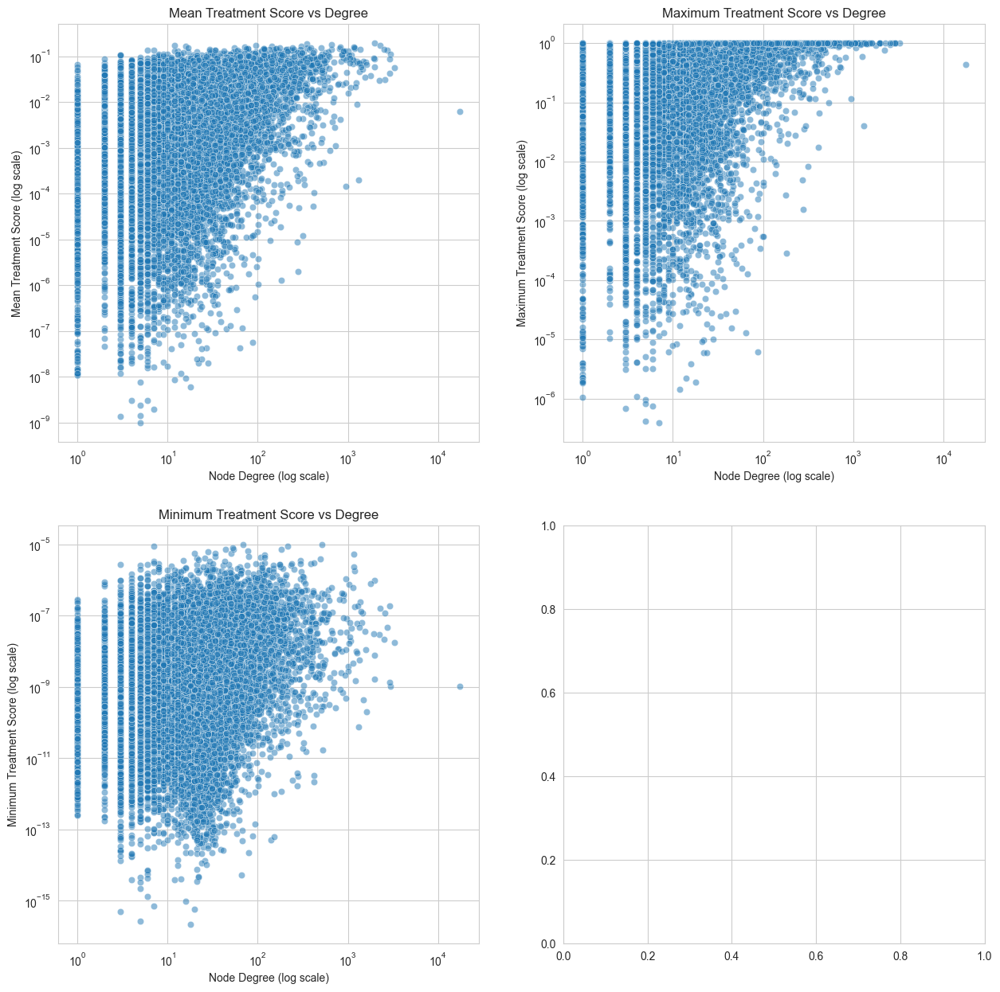

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
sns.set_style('whitegrid')

# Plot 1: Mean Score vs Degree
sns.scatterplot(data=df_gs, x='degree', y=('treat score', 'mean'), alpha=0.5, ax=axes[0,0])
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_title('Mean Treatment Score vs Degree')
axes[0,0].set_xlabel('Node Degree (log scale)')
axes[0,0].set_ylabel('Mean Treatment Score (log scale)')

# Plot 2: Max Score vs Degree
sns.scatterplot(data=df_gs, x='degree', y=('treat score', 'max'), alpha=0.5, ax=axes[0,1])
axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')
axes[0,1].set_title('Maximum Treatment Score vs Degree')
axes[0,1].set_xlabel('Node Degree (log scale)')
axes[0,1].set_ylabel('Maximum Treatment Score (log scale)')

# Plot 3: Min Score vs Degree
sns.scatterplot(data=df_gs, x='degree', y=('treat score', 'min'), alpha=0.5, ax=axes[1,0])
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_title('Minimum Treatment Score vs Degree')
axes[1,0].set_xlabel('Node Degree (log scale)')
axes[1,0].set_ylabel('Minimum Treatment Score (log scale)')

# Plot 4: Score Range (Max-Min) vs Degree
df['score_range'] = df_gs[('treat score', 'max')] - df[('treat score', 'min')]
sns.scatterplot(data=df, x='degree', y='score_range', alpha=0.5, ax=axes[1,1])
axes[1,1].set_xscale('log')
axes[1,1].set_yscale('log')
axes[1,1].set_title('Treatment Score Range vs Degree')
axes[1,1].set_xlabel('Node Degree (log scale)')
axes[1,1].set_ylabel('Score Range log (Max - Min)')

plt.tight_layout()

for i in range(2):
    for j in range(2):
        if i == 1 and j == 1:
            y = df_gs['score_range']
        else:
            y = df_gs[('treat score', ['mean', 'max', 'min'][i*2 + j])]
        x = df_gs['degree']
        z = np.polyfit(np.log10(x), y, 1)
        p = np.poly1d(z)
        axes[i,j].plot(sorted(x), p(np.log10(sorted(x))), "r--", alpha=0.8)

Text(0.5, 0, 'Degree Percentile Bin')

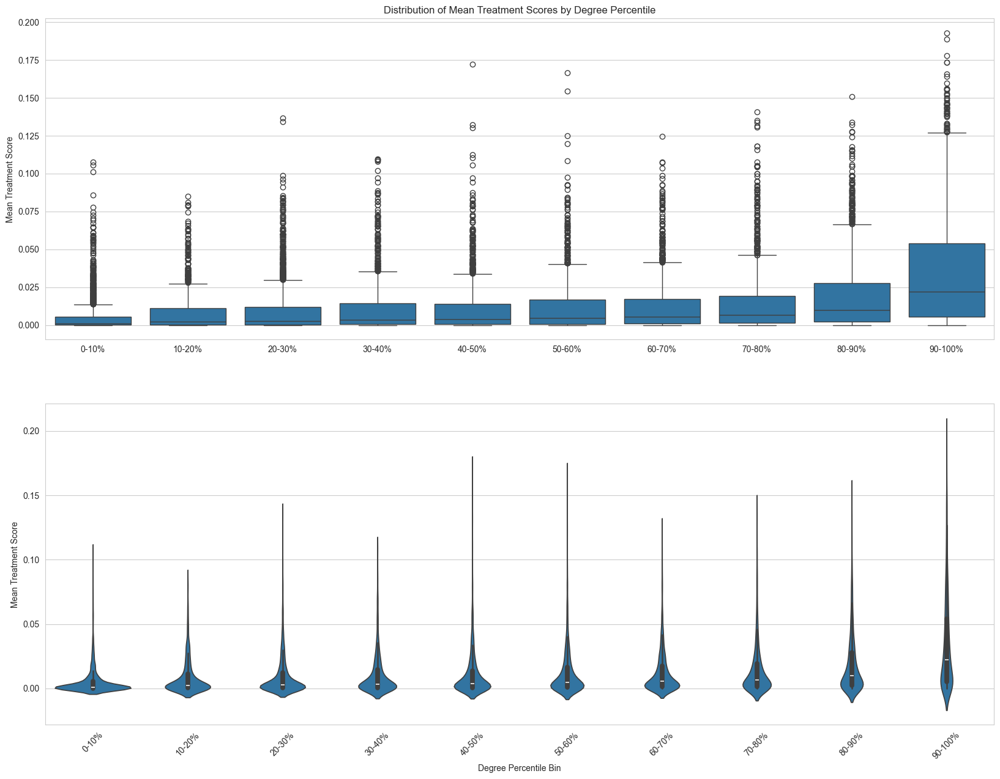

In [13]:

plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df_gs['degree_bin'] = pd.qcut(df_gs['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

plt.title('Distribution of Mean Treatment Scores by Degree Percentile')
sns.boxplot(data=df_gs, x='degree_bin', y=('treat score', 'mean'))
plt.xlabel('')
plt.ylabel('Mean Treatment Score')
plt.subplot(2,1,2)
sns.violinplot(data=df_gs, x='degree_bin', y=('treat score', 'mean'))
plt.xticks(rotation=45)
plt.ylabel('Mean Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

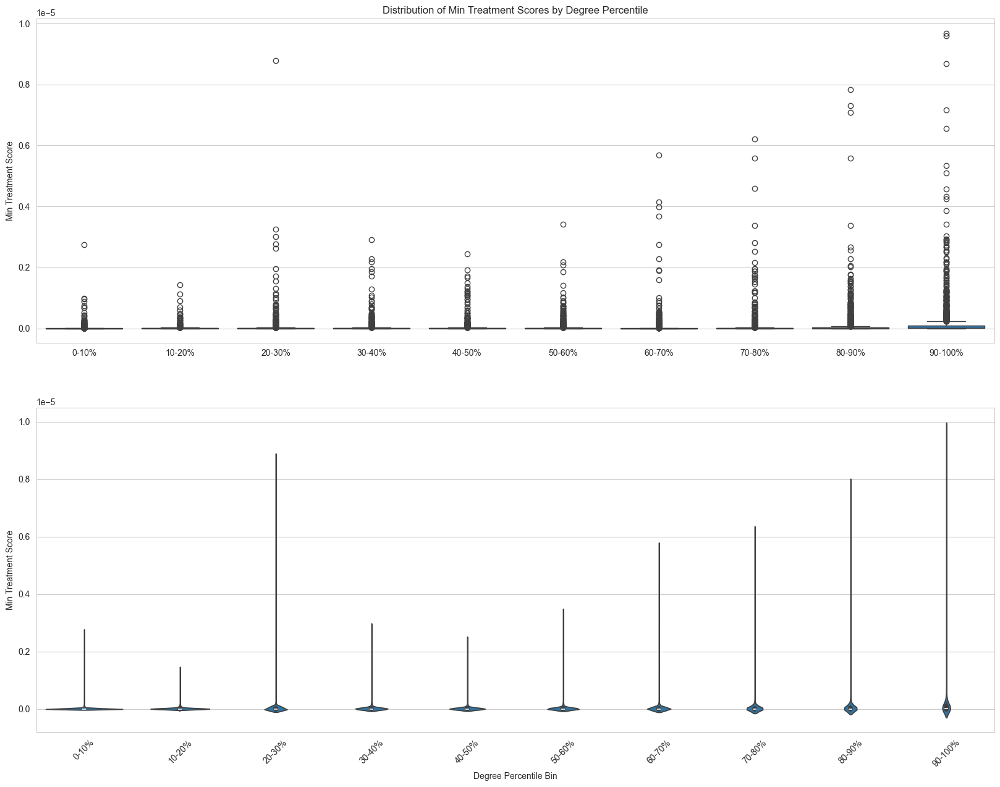

In [14]:

plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_gs['degree_bin'] = pd.qcut(df_gs['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Min Treatment Scores by Degree Percentile')
sns.boxplot(data=df_gs, x='degree_bin', y=('treat score', 'min'))
plt.ylabel('Min Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_gs, x='degree_bin', y=('treat score', 'min'))
plt.xticks(rotation=45)
plt.ylabel('Min Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

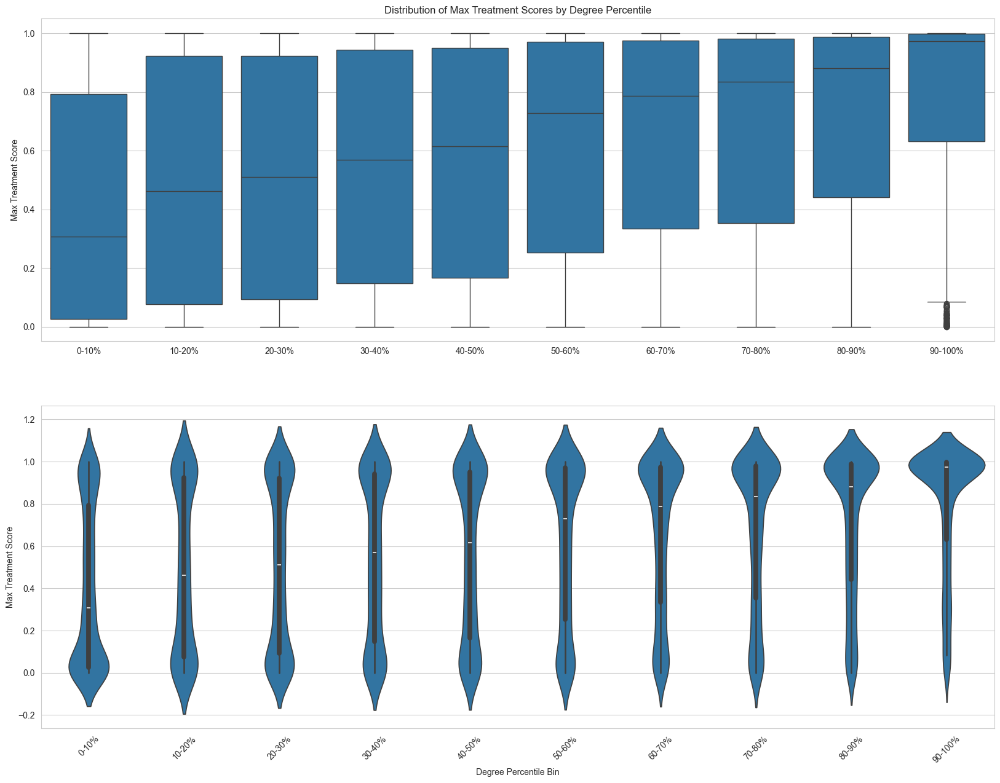

In [15]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df_gs['degree_bin'] = pd.qcut(df_gs['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Max Treatment Scores by Degree Percentile')
sns.boxplot(data=df_gs, x='degree_bin', y=('treat score', 'max'))
plt.ylabel('Max Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_gs, x='degree_bin', y=('treat score', 'max'))
plt.xticks(rotation=45)
plt.ylabel('Max Treatment Score')
plt.xlabel('Degree Percentile Bin')


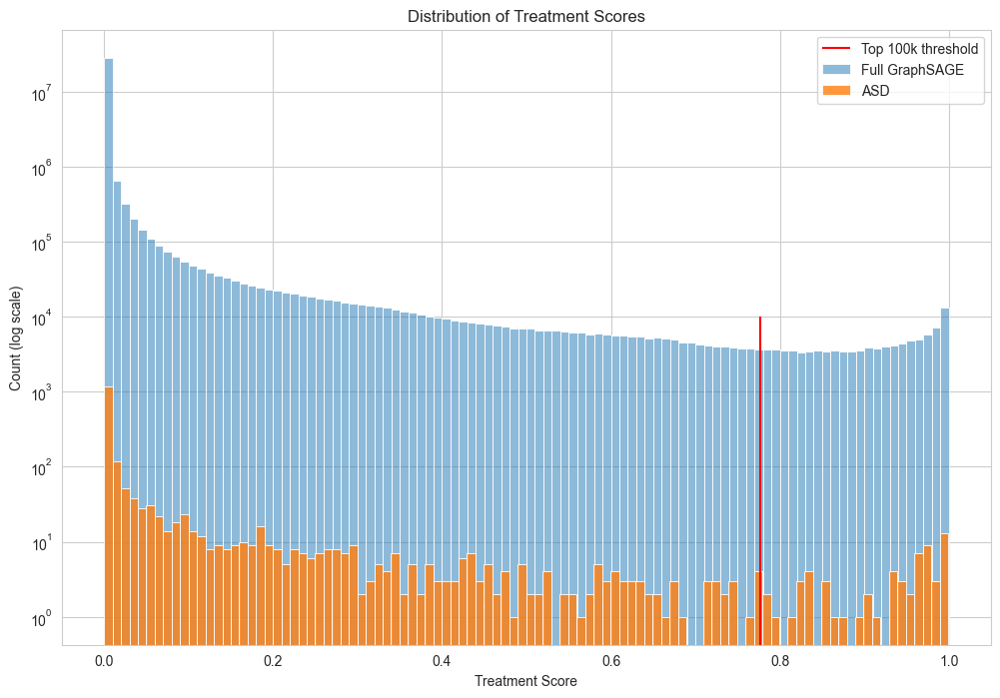

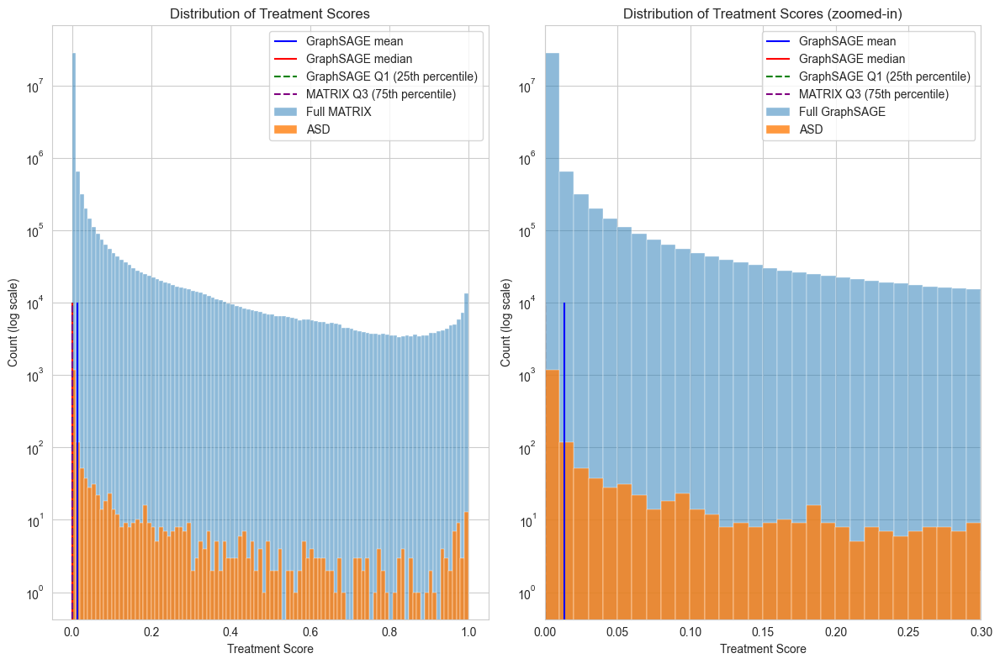

In [83]:

import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full GraphSAGE', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='ASD', alpha=0.8)
plt.vlines(gs_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='ASD', alpha=0.8)

q25 = gs_matrix_scores['treat score'].quantile(0.25)
q75 = gs_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(gs_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='GraphSAGE mean')
plt.vlines(gs_matrix_scores['treat score'].median(), 0, 10000, color='red', label='GraphSAGE median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='GraphSAGE Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full GraphSAGE', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='ASD', alpha=0.8)

q25 = gs_matrix_scores['treat score'].quantile(0.25)
q75 = gs_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(gs_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='GraphSAGE mean')
plt.vlines(gs_matrix_scores['treat score'].median(), 0, 10000, color='red', label='GraphSAGE median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='GraphSAGE Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

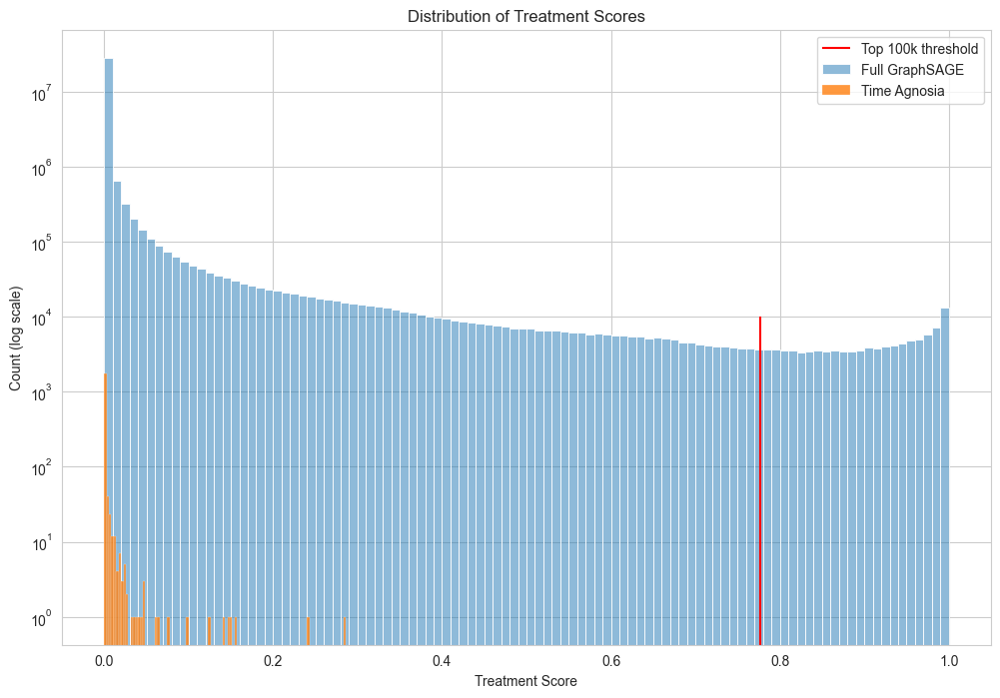

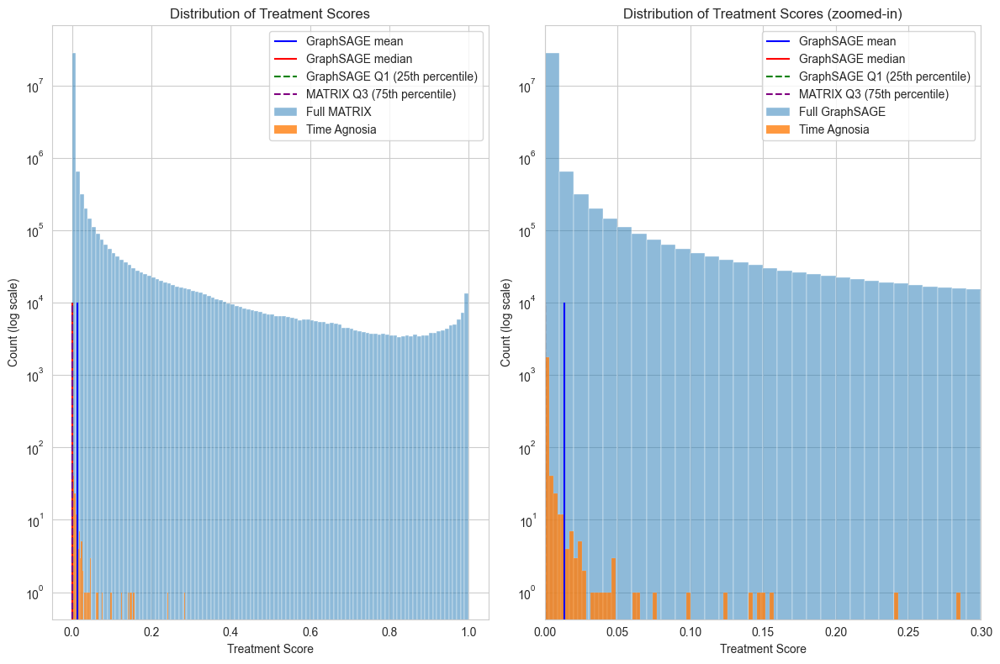

In [17]:

import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full GraphSAGE', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(gs_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = gs_matrix_scores['treat score'].quantile(0.25)
q75 = gs_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(gs_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='GraphSAGE mean')
plt.vlines(gs_matrix_scores['treat score'].median(), 0, 10000, color='red', label='GraphSAGE median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='GraphSAGE Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full GraphSAGE', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = gs_matrix_scores['treat score'].quantile(0.25)
q75 = gs_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(gs_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='GraphSAGE mean')
plt.vlines(gs_matrix_scores['treat score'].median(), 0, 10000, color='red', label='GraphSAGE median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='GraphSAGE Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

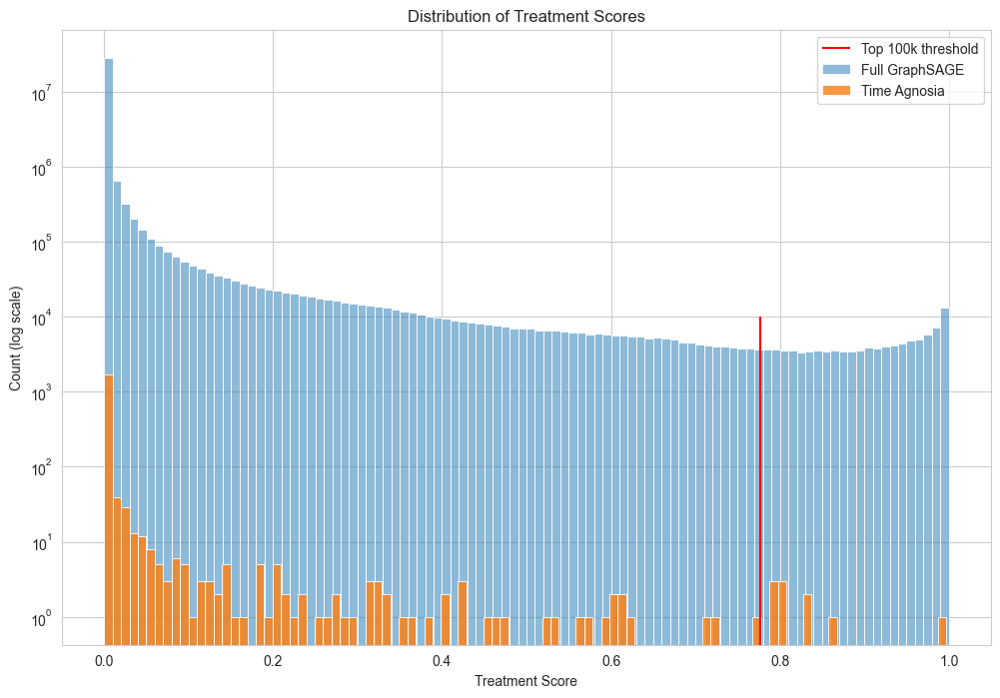

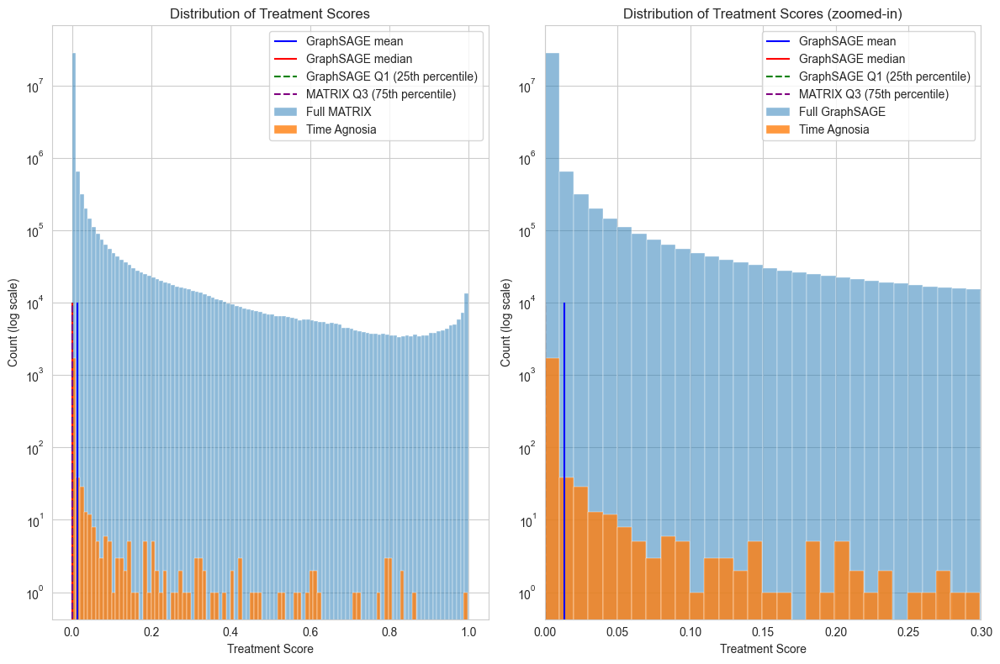

In [16]:

import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full GraphSAGE', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(gs_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full MATRIX', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = gs_matrix_scores['treat score'].quantile(0.25)
q75 = gs_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(gs_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='GraphSAGE mean')
plt.vlines(gs_matrix_scores['treat score'].median(), 0, 10000, color='red', label='GraphSAGE median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='GraphSAGE Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=gs_matrix_scores, x='treat score', bins=100, label='Full GraphSAGE', alpha=0.5)
sns.histplot(data=gs_matrix_scores.loc[gs_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = gs_matrix_scores['treat score'].quantile(0.25)
q75 = gs_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(gs_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='GraphSAGE mean')
plt.vlines(gs_matrix_scores['treat score'].median(), 0, 10000, color='red', label='GraphSAGE median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='GraphSAGE Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

We can see that the scores are much better for time agnosia and in general, the frequent losers issues seems to be not as emphasised as in case of GraphSAGE

# Node2Vec Biased Walk - solution to frequent losers?
Node2vec has parameters allowing you to bias the walk based on Depth-first search or Breadth-first search. My hypothesis was that maybe decreasing depth-first search will help with frequent losers as technically random walks should then revolve around the local nodes. Below is a quick visualisation of how this could work:

Node2vec Biased Walk

# Node2Vec q=1 p=0.25
Means that probability of traversing around a specific node 1/0.25 higher than traversing globally.Model performance unchanged

In [41]:
n2v_v1_matrix_scores = pd.read_parquet('gs://mtrx-us-central1-hub-dev-storage/archive/runs/old-release-silc-local-n2v/07_model_output/xg_ensemble/matrix_predictions')

# Merge matrix scores with degree information
df_n2v_v1 = (n2v_v1_matrix_scores.groupby('target')
             .agg({'treat score': ['min', 'max', 'mean']})
             .merge(df[['id', 'degree']].rename(columns={'id': 'target'}), 
                   on='target', 
                   how='left'))

df_n2v_v1.sort_values(('treat score', 'min'), ascending=False)


/var/folders/8k/ct7ltxz14k37shrv70134t1c0000gp/T/ipykernel_2025/2601349508.py:6: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  .merge(df[['id', 'degree']].rename(columns={'id': 'target'}),


,target,"(treat score, min)","(treat score, max)","(treat score, mean)",degree
5101,MONDO:0008638,2.068338e-05,0.998288,8.396361e-02,274
2658,MONDO:0004907,1.345489e-05,0.999780,7.453396e-02,732
396,MONDO:0000948,5.154662e-06,0.999287,4.465438e-02,28
782,MONDO:0001538,4.754646e-06,0.997921,3.811060e-02,90
4306,MONDO:0007727,4.743184e-06,0.998798,4.747807e-02,84
...,...,...,...,...,...
9522,MONDO:0013918,2.401850e-14,0.000624,4.622628e-07,7
10892,MONDO:0015689,1.890420e-14,0.000055,3.773448e-08,3
13085,MONDO:0019449,1.615710e-14,0.000003,1.455562e-08,3
11634,MONDO:0017102,2.851341e-15,0.000025,4.552065e-08,7


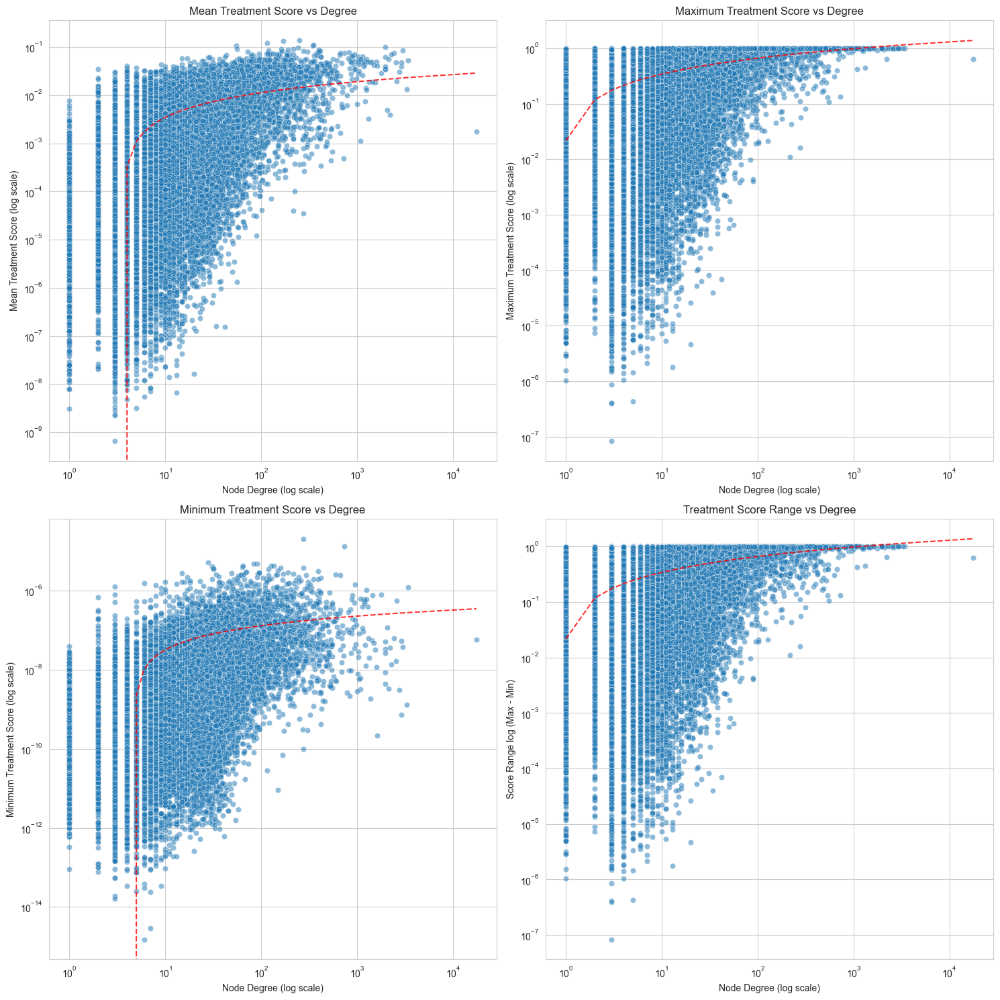

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
sns.set_style('whitegrid')

# Plot 1: Mean Score vs Degree
sns.scatterplot(data=df_n2v_v1, x='degree', y=('treat score', 'mean'), alpha=0.5, ax=axes[0,0])
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_title('Mean Treatment Score vs Degree')
axes[0,0].set_xlabel('Node Degree (log scale)')
axes[0,0].set_ylabel('Mean Treatment Score (log scale)')

# Plot 2: Max Score vs Degree
sns.scatterplot(data=df_n2v_v1, x='degree', y=('treat score', 'max'), alpha=0.5, ax=axes[0,1])
axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')
axes[0,1].set_title('Maximum Treatment Score vs Degree')
axes[0,1].set_xlabel('Node Degree (log scale)')
axes[0,1].set_ylabel('Maximum Treatment Score (log scale)')

# Plot 3: Min Score vs Degree
sns.scatterplot(data=df_n2v_v1, x='degree', y=('treat score', 'min'), alpha=0.5, ax=axes[1,0])
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_title('Minimum Treatment Score vs Degree')
axes[1,0].set_xlabel('Node Degree (log scale)')
axes[1,0].set_ylabel('Minimum Treatment Score (log scale)')

# Plot 4: Score Range (Max-Min) vs Degree
df_n2v_v1['score_range'] = df_n2v_v1[('treat score', 'max')] - df_n2v_v1[('treat score', 'min')]
sns.scatterplot(data=df_n2v_v1, x='degree', y='score_range', alpha=0.5, ax=axes[1,1])
axes[1,1].set_xscale('log')
axes[1,1].set_yscale('log')
axes[1,1].set_title('Treatment Score Range vs Degree')
axes[1,1].set_xlabel('Node Degree (log scale)')
axes[1,1].set_ylabel('Score Range log (Max - Min)')

plt.tight_layout()

# Optional: Add trend lines
for i in range(2):
    for j in range(2):
        if i == 1 and j == 1:
            y = df_n2v_v1['score_range']
        else:
            y = df_n2v_v1[('treat score', ['mean', 'max', 'min'][i*2 + j])]
        x = df_n2v_v1['degree']
        z = np.polyfit(np.log10(x), y, 1)
        p = np.poly1d(z)
        axes[i,j].plot(sorted(x), p(np.log10(sorted(x))), "r--", alpha=0.8)

Text(0.5, 0, 'Degree Percentile Bin')

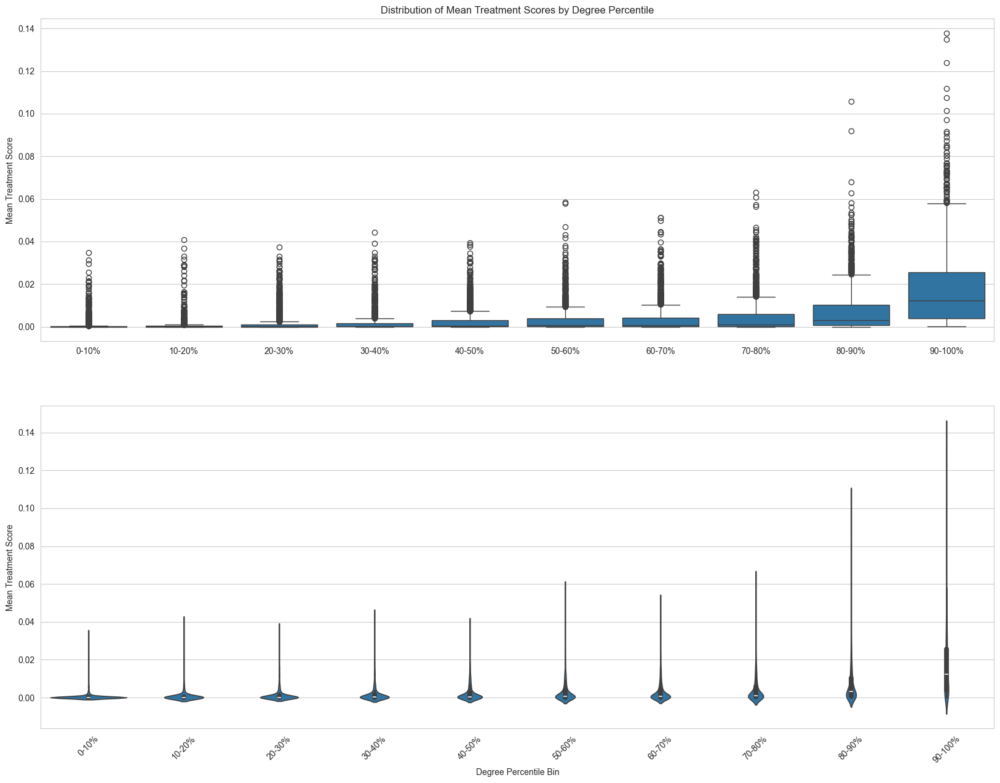

In [43]:
# 1. Box plots by degree bins
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_n2v_v1['degree_bin'] = pd.qcut(df_n2v_v1['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Mean Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v1, x='degree_bin', y=('treat score', 'mean'))
plt.xlabel('')
plt.ylabel('Mean Treatment Score')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v1, x='degree_bin', y=('treat score', 'mean'))
plt.xticks(rotation=45)
plt.ylabel('Mean Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

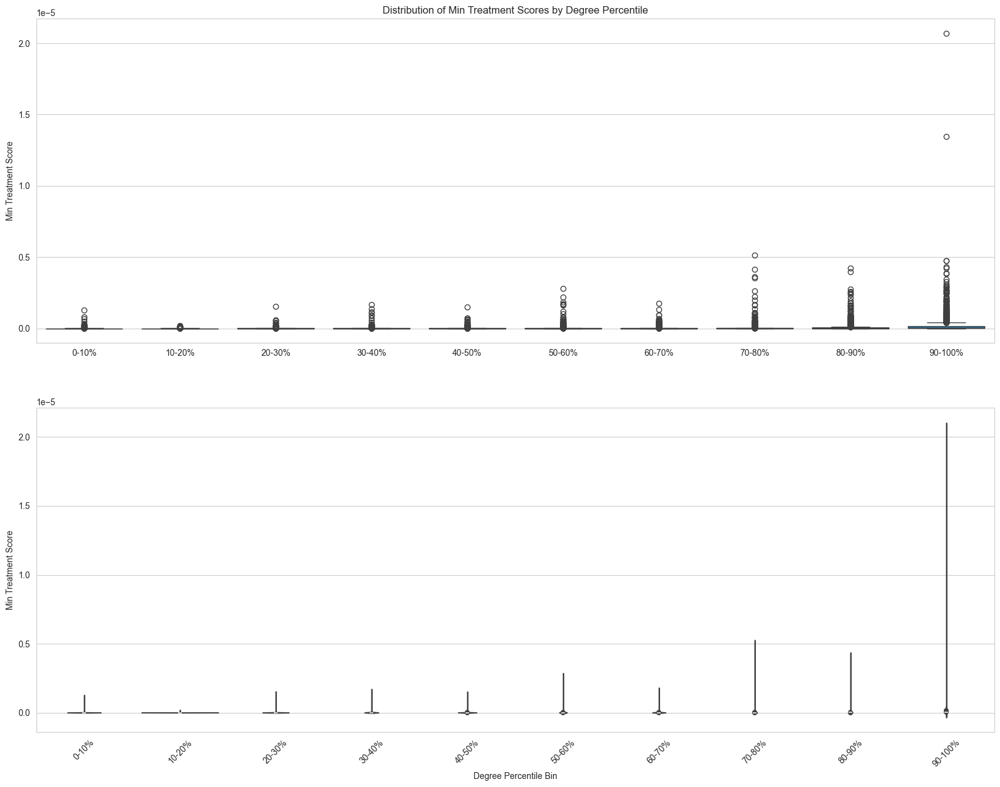

In [44]:

plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_n2v_v1['degree_bin'] = pd.qcut(df_n2v_v1['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Min Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v1, x='degree_bin', y=('treat score', 'min'))
plt.ylabel('Min Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v1, x='degree_bin', y=('treat score', 'min'))
plt.xticks(rotation=45)
plt.ylabel('Min Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

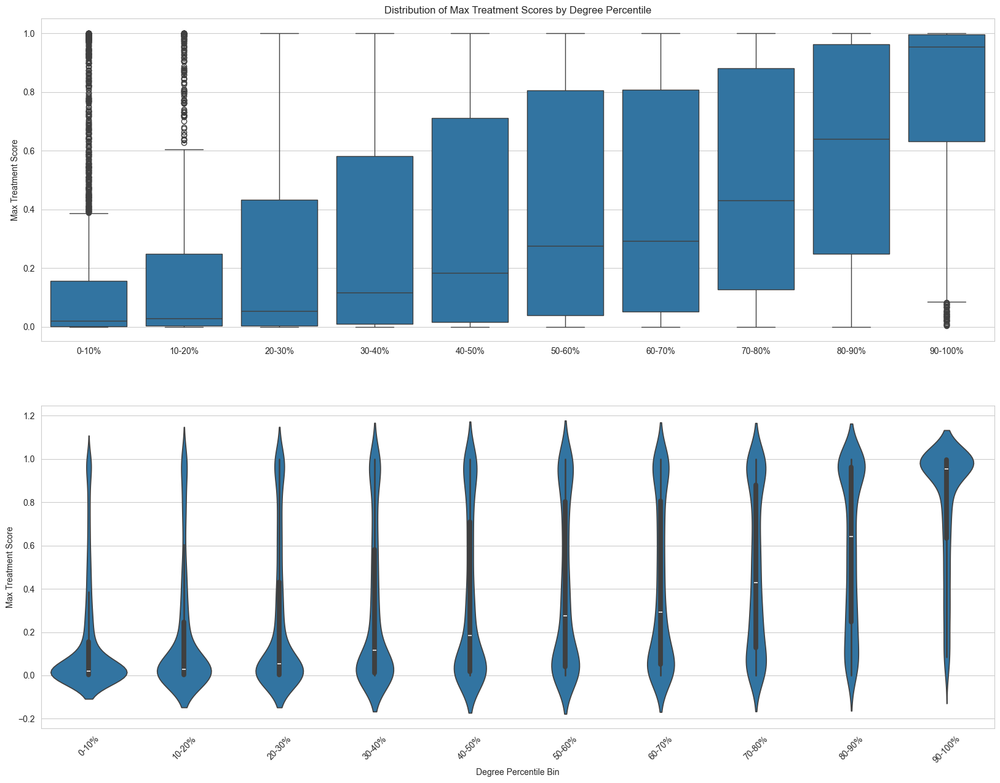

In [45]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df_n2v_v1['degree_bin'] = pd.qcut(df_n2v_v1['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot   
plt.title('Distribution of Max Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v1, x='degree_bin', y=('treat score', 'max'))
plt.ylabel('Max Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v1, x='degree_bin', y=('treat score', 'max'))
plt.xticks(rotation=45)
plt.ylabel('Max Treatment Score')
plt.xlabel('Degree Percentile Bin')


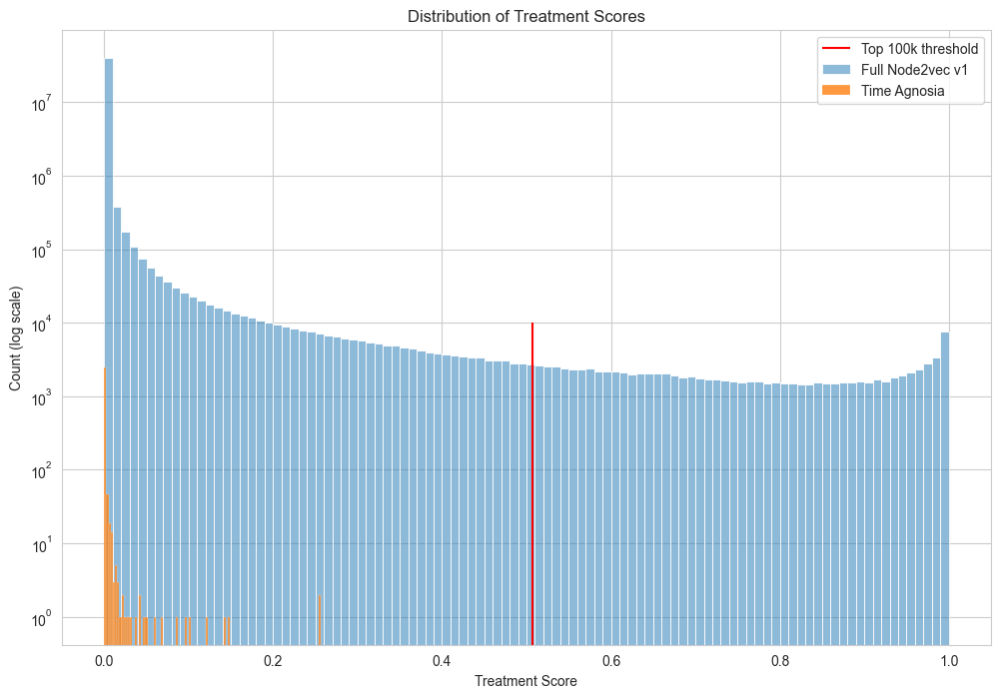

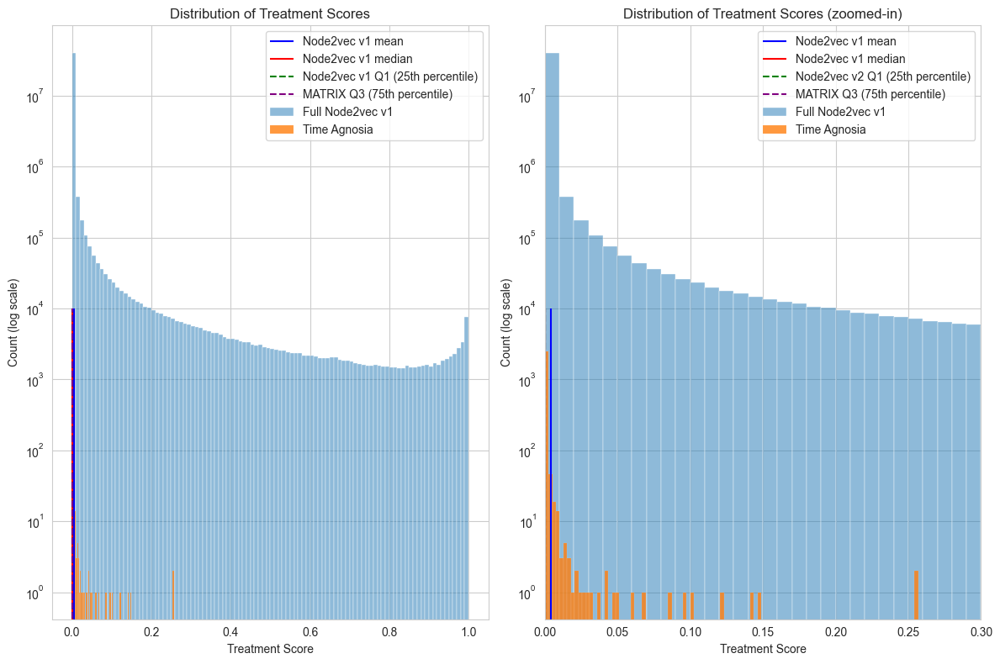

In [46]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot   
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.5)
sns.histplot(data=n2v_v1_matrix_scores.loc[n2v_v1_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(n2v_v1_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.5)
sns.histplot(data=n2v_v1_matrix_scores.loc[n2v_v1_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v1_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v1_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v1_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v1 mean')
plt.vlines(n2v_v1_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v1 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v1 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.5)
sns.histplot(data=n2v_v1_matrix_scores.loc[n2v_v1_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v1_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v1_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v1_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v1 mean')
plt.vlines(n2v_v1_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v1 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

In [67]:
# SILC comparison
excel = pd.read_excel('../scratch/repurposing_silc.xlsx', sheet_name='xg_ensemble_report_n2v_v1')
excel

,drug_id,drug_name,disease_id,disease_name,treat_score,is_known_positive,is_known_negative
0,CHEMBL.COMPOUND:CHEMBL1201576,RITUXIMAB,EC:8,EC:8,0.8015,False,False
1,CHEMBL.COMPOUND:CHEMBL468,THALIDOMIDE,EC:8,EC:8,0.3263,False,False
2,CHEMBL.COMPOUND:CHEMBL650,METHYLPREDNISOLONE,EC:8,EC:8,0.2626,False,False
3,CHEMBL.COMPOUND:CHEMBL620,CLIDINIUM,EC:8,EC:8,0.2373,False,False
4,CHEMBL.COMPOUND:CHEMBL1643,RIBAVIRIN,EC:3,EC:3,0.2335,False,False
...,...,...,...,...,...,...,...
25625,RXNORM:71225,Apomorphine hydrochloride,EC:4,EC:4,0.0000,False,False
25626,CHEMBL.COMPOUND:CHEMBL3301675,LINACLOTIDE,EC:4,EC:4,0.0000,False,False
25627,CHEMBL.COMPOUND:CHEMBL415690,BETADEX,EC:4,EC:4,0.0000,False,False
25628,RXNORM:1791686,pimavanserin tartrate,EC:4,EC:4,0.0000,False,False


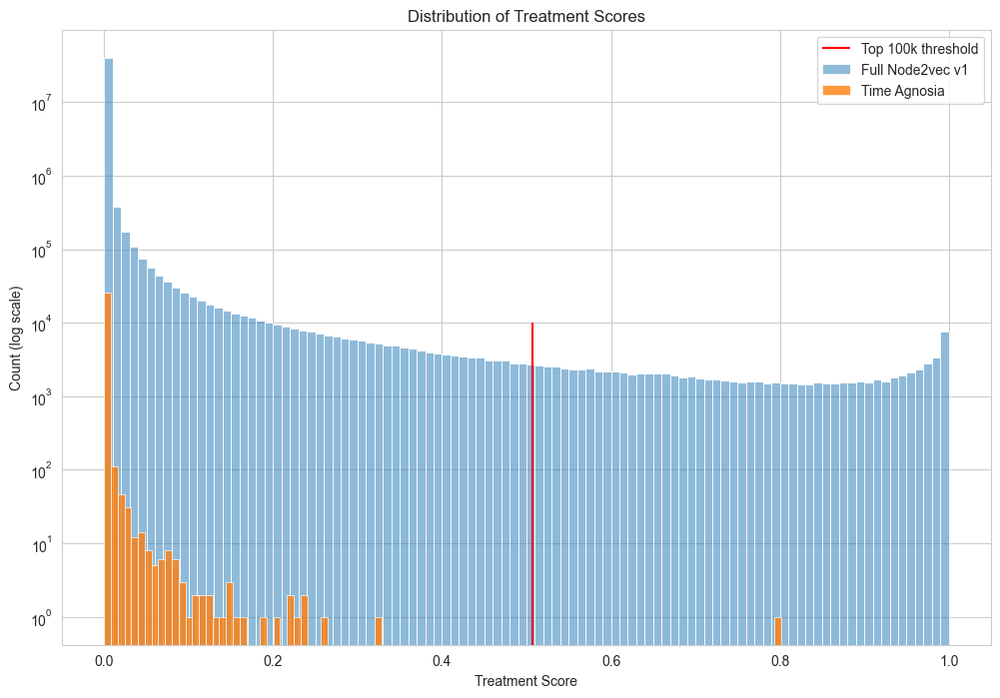

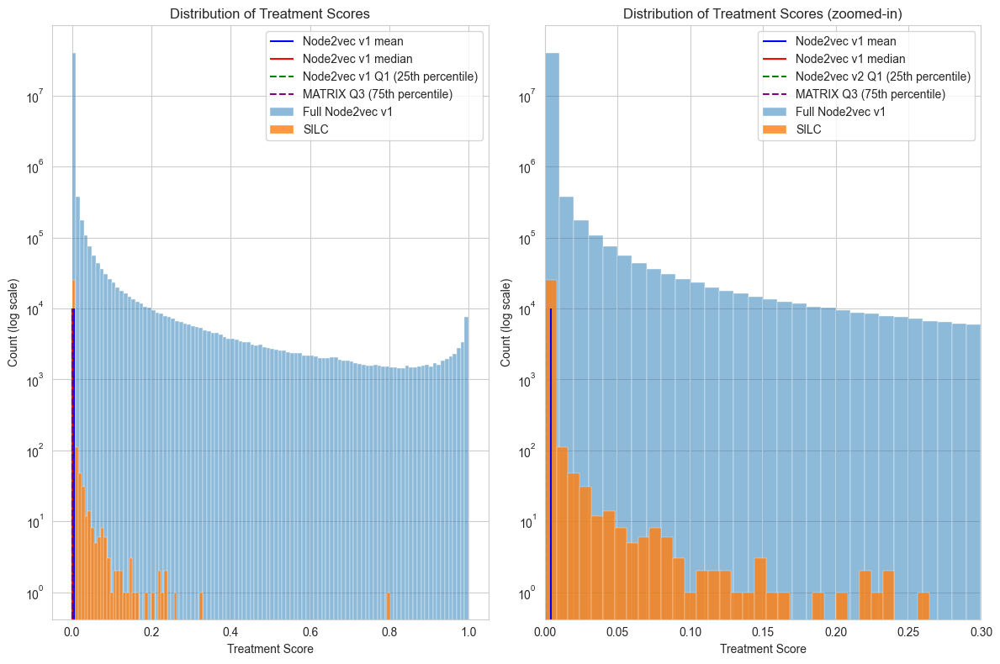

In [68]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot   
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.5)
sns.histplot(data=excel, x='treat_score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(n2v_v1_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.5)
sns.histplot(data=excel, x='treat_score', bins=100, label='SILC', alpha=0.8)

q25 = n2v_v1_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v1_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v1_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v1 mean')
plt.vlines(n2v_v1_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v1 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v1 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.5)
sns.histplot(data=excel, x='treat_score', bins=100, label='SILC', alpha=0.8)

q25 = n2v_v1_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v1_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v1_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v1 mean')
plt.vlines(n2v_v1_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v1 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

The results show that this is not really affecting the performance nor is it affecting the degree distribution/results. Distribution for sparse graphs looks less consistent with more outliers being present which is not necessarily a thign we want to achieve

# Node2Vec q=2 p=0.25

In this case, the random walk is still weighted to traverse more locally but also to focus on BFS walk


In [18]:
n2v_v3_matrix_scores = pd.read_parquet('gs://mtrx-us-central1-hub-dev-storage/archive/runs/old-release-silc-local-n2v-v3/07_model_output/xg_ensemble/matrix_predictions')

# Merge matrix scores with degree information
df_n2v_v3 = (n2v_v3_matrix_scores.groupby('target')
             .agg({'treat score': ['min', 'max', 'mean']})
             .merge(df[['id', 'degree']].rename(columns={'id': 'target'}), 
                   on='target', 
                   how='left'))

df_n2v_v3.sort_values(('treat score', 'min'), ascending=False)


/var/folders/8k/ct7ltxz14k37shrv70134t1c0000gp/T/ipykernel_2025/317814236.py:6: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  .merge(df[['id', 'degree']].rename(columns={'id': 'target'}),


,target,"(treat score, min)","(treat score, max)","(treat score, mean)",degree
2658,MONDO:0004907,1.546263e-05,9.999878e-01,7.241923e-02,732
12388,MONDO:0018301,1.390322e-05,9.940440e-01,1.298797e-01,119
12305,MONDO:0018150,9.165178e-06,9.545307e-01,5.081961e-02,392
5521,MONDO:0009109,8.100214e-06,9.698681e-01,3.610481e-02,160
15996,MONDO:0100096,6.461434e-06,9.930933e-01,7.815702e-02,413
...,...,...,...,...,...
11628,MONDO:0017095,9.384585e-15,6.554654e-06,6.958494e-09,9
13570,MONDO:0020422,9.183049e-15,3.149893e-07,1.229672e-09,3
11643,MONDO:0017113,7.438131e-15,9.511509e-07,2.889775e-09,3
10892,MONDO:0015689,6.773025e-15,1.935777e-05,4.546129e-08,3


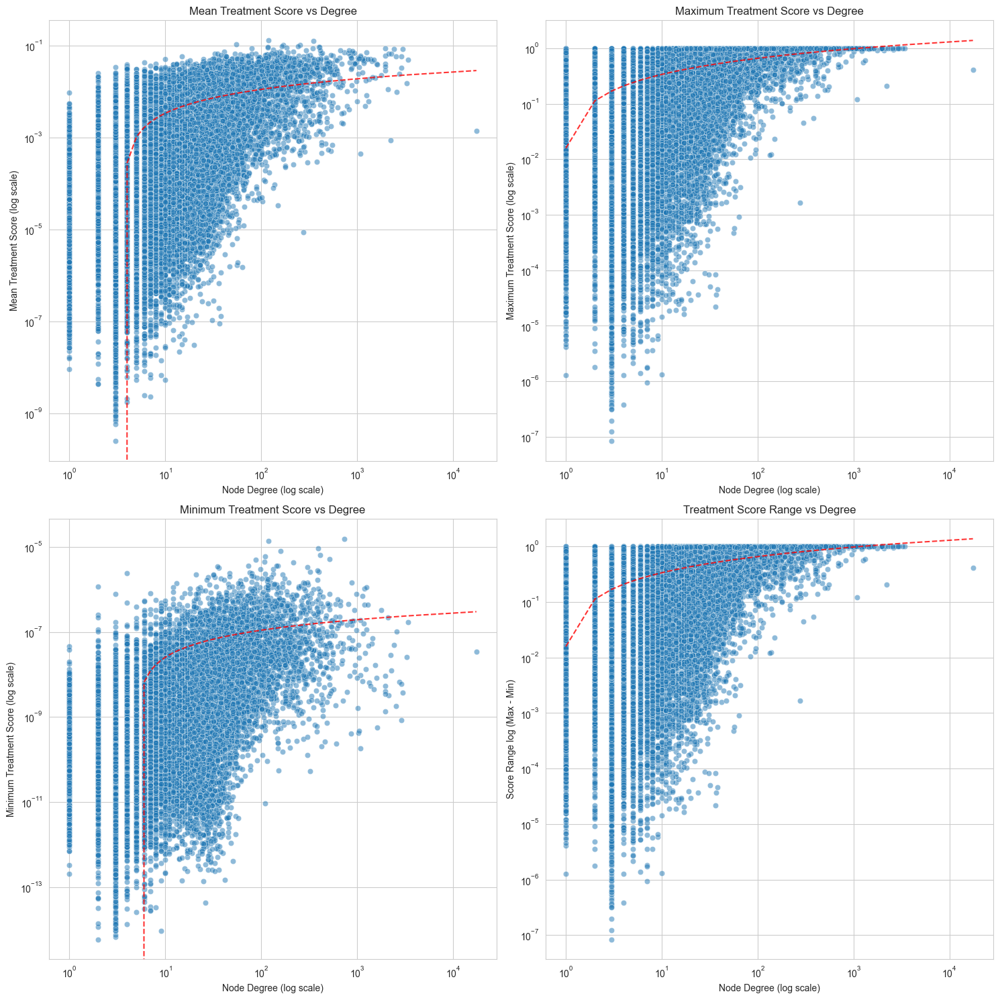

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
sns.set_style('whitegrid')

# Plot 1: Mean Score vs Degree
sns.scatterplot(data=df_n2v_v3, x='degree', y=('treat score', 'mean'), alpha=0.5, ax=axes[0,0])
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_title('Mean Treatment Score vs Degree')
axes[0,0].set_xlabel('Node Degree (log scale)')
axes[0,0].set_ylabel('Mean Treatment Score (log scale)')

# Plot 2: Max Score vs Degree
sns.scatterplot(data=df_n2v_v3, x='degree', y=('treat score', 'max'), alpha=0.5, ax=axes[0,1])
axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')
axes[0,1].set_title('Maximum Treatment Score vs Degree')
axes[0,1].set_xlabel('Node Degree (log scale)')
axes[0,1].set_ylabel('Maximum Treatment Score (log scale)')

# Plot 3: Min Score vs Degree
sns.scatterplot(data=df_n2v_v3, x='degree', y=('treat score', 'min'), alpha=0.5, ax=axes[1,0])
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_title('Minimum Treatment Score vs Degree')
axes[1,0].set_xlabel('Node Degree (log scale)')
axes[1,0].set_ylabel('Minimum Treatment Score (log scale)')

# Plot 4: Score Range (Max-Min) vs Degree
df_n2v_v3['score_range'] = df_n2v_v3[('treat score', 'max')] - df_n2v_v3[('treat score', 'min')]
sns.scatterplot(data=df_n2v_v3, x='degree', y='score_range', alpha=0.5, ax=axes[1,1])
axes[1,1].set_xscale('log')
axes[1,1].set_yscale('log')
axes[1,1].set_title('Treatment Score Range vs Degree')
axes[1,1].set_xlabel('Node Degree (log scale)')
axes[1,1].set_ylabel('Score Range log (Max - Min)')

plt.tight_layout()

# Optional: Add trend lines
for i in range(2):
    for j in range(2):
        if i == 1 and j == 1:
            y = df_n2v_v3['score_range']
        else:
            y = df_n2v_v3[('treat score', ['mean', 'max', 'min'][i*2 + j])]
        x = df_n2v_v3['degree']
        z = np.polyfit(np.log10(x), y, 1)
        p = np.poly1d(z)
        axes[i,j].plot(sorted(x), p(np.log10(sorted(x))), "r--", alpha=0.8)

Text(0.5, 0, 'Degree Percentile Bin')

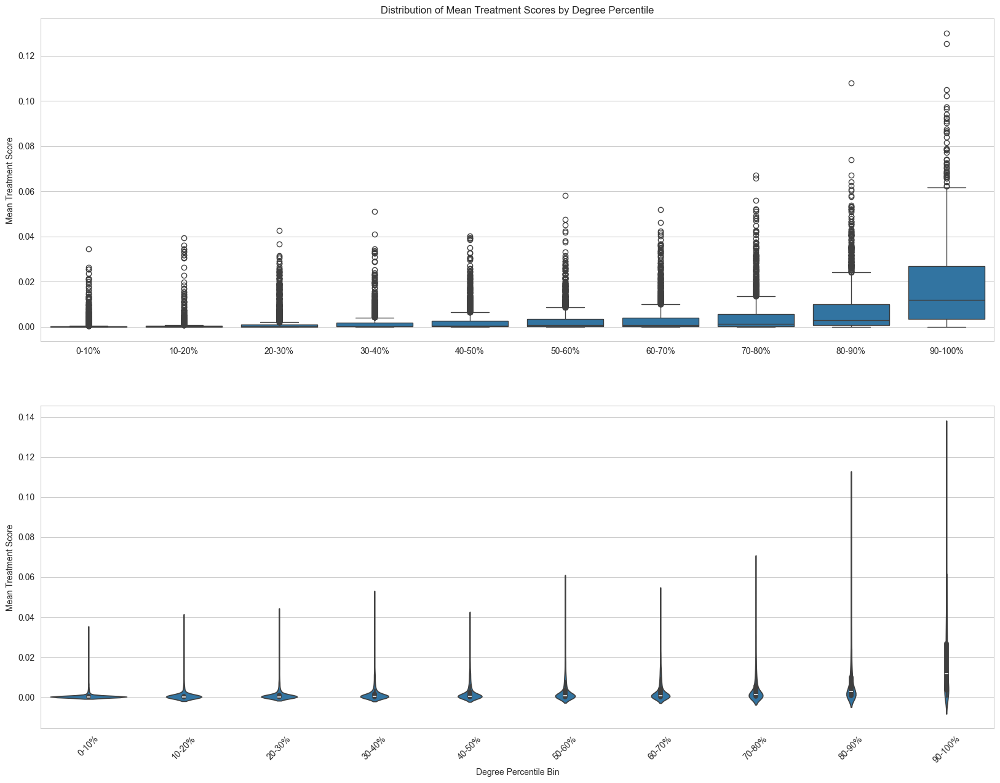

In [29]:
# 1. Box plots by degree bins
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_n2v_v3['degree_bin'] = pd.qcut(df_n2v_v3['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Mean Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v3, x='degree_bin', y=('treat score', 'mean'))
plt.xlabel('')
plt.ylabel('Mean Treatment Score')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v3, x='degree_bin', y=('treat score', 'mean'))
plt.xticks(rotation=45)
plt.ylabel('Mean Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

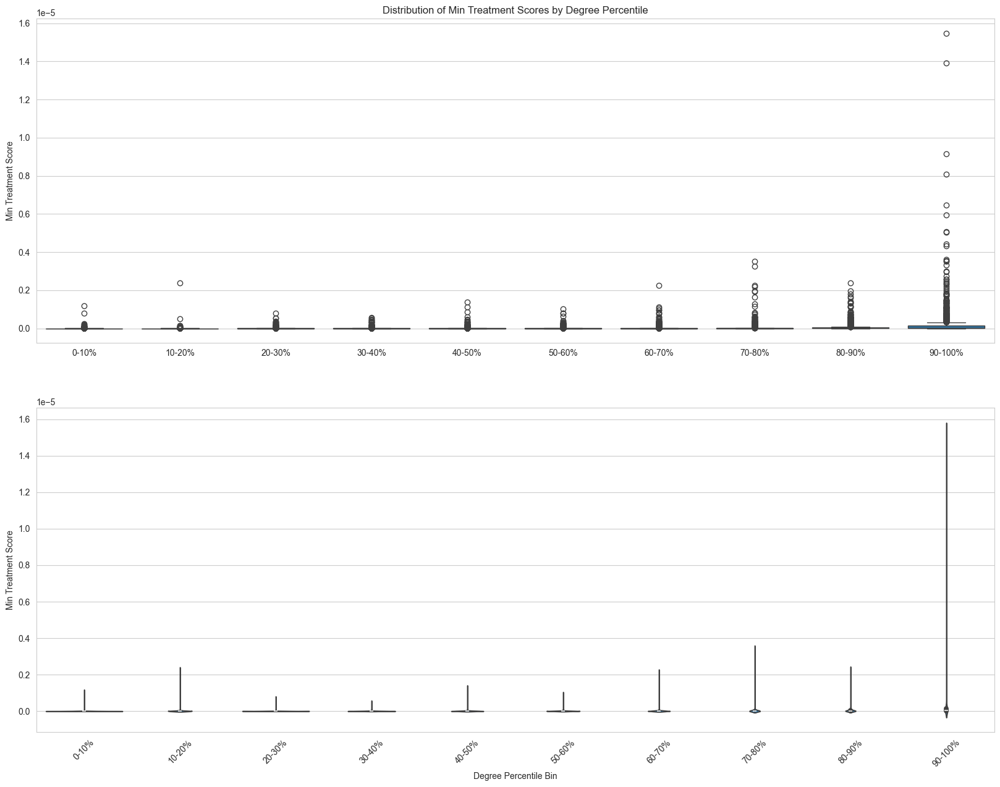

In [30]:

plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_n2v_v3['degree_bin'] = pd.qcut(df_n2v_v3['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Min Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v3, x='degree_bin', y=('treat score', 'min'))
plt.ylabel('Min Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v3, x='degree_bin', y=('treat score', 'min'))
plt.xticks(rotation=45)
plt.ylabel('Min Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

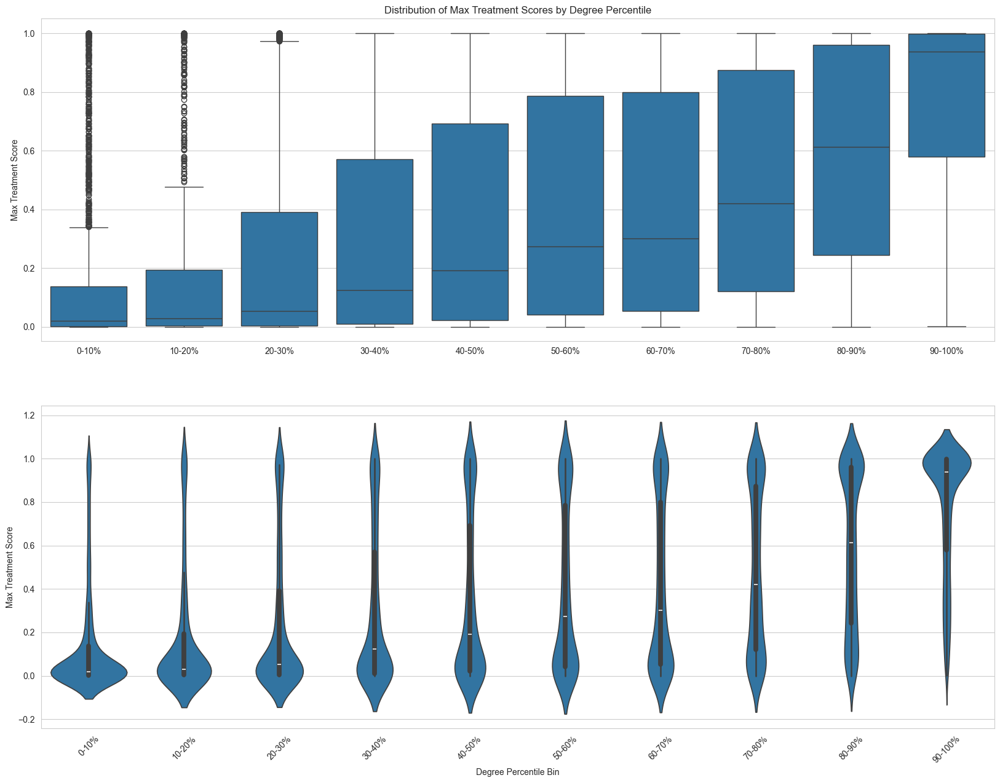

In [31]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df_n2v_v3['degree_bin'] = pd.qcut(df_n2v_v3['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Max Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v3, x='degree_bin', y=('treat score', 'max'))
plt.ylabel('Max Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v3, x='degree_bin', y=('treat score', 'max'))
plt.xticks(rotation=45)
plt.ylabel('Max Treatment Score')
plt.xlabel('Degree Percentile Bin')


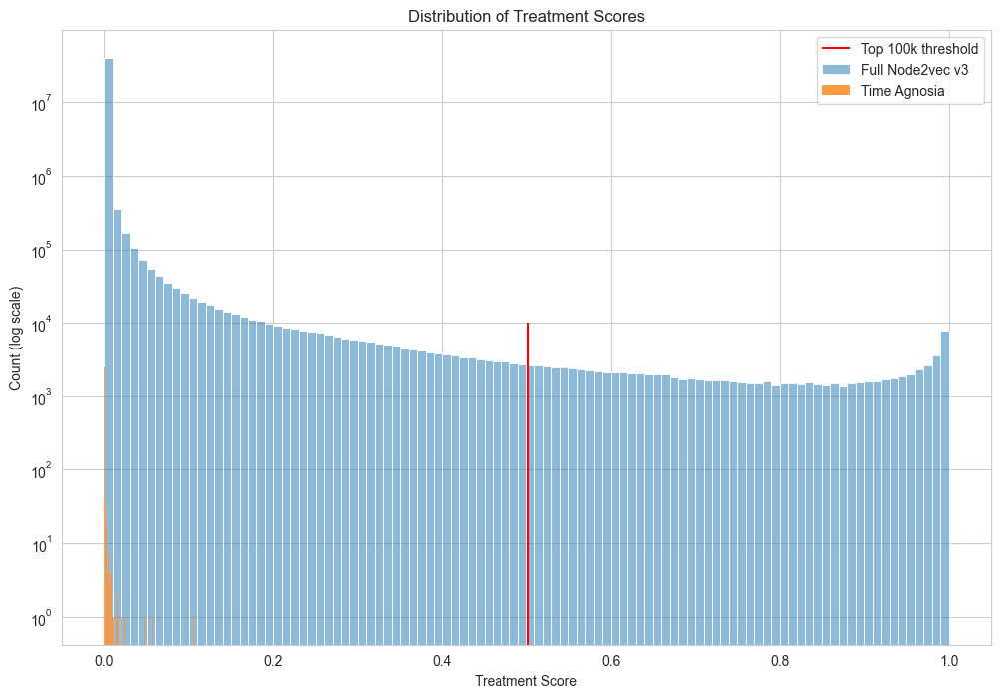

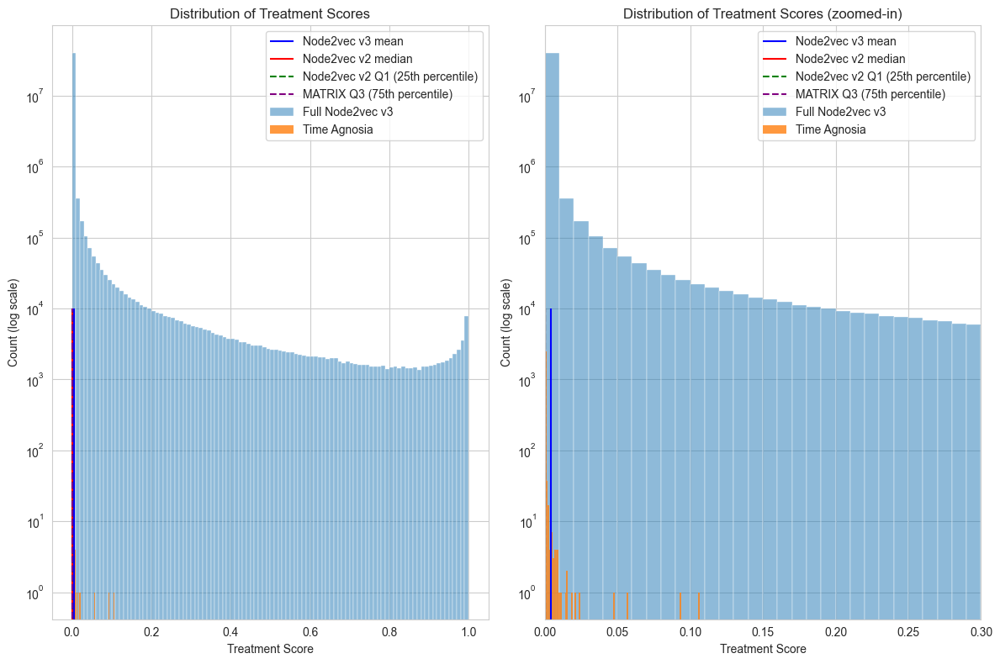

In [32]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot   
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.5)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(n2v_v3_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.5)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v3_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v3_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v3_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v3 mean')
plt.vlines(n2v_v3_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.5)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v3_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v3_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v3_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v3 mean')
plt.vlines(n2v_v3_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

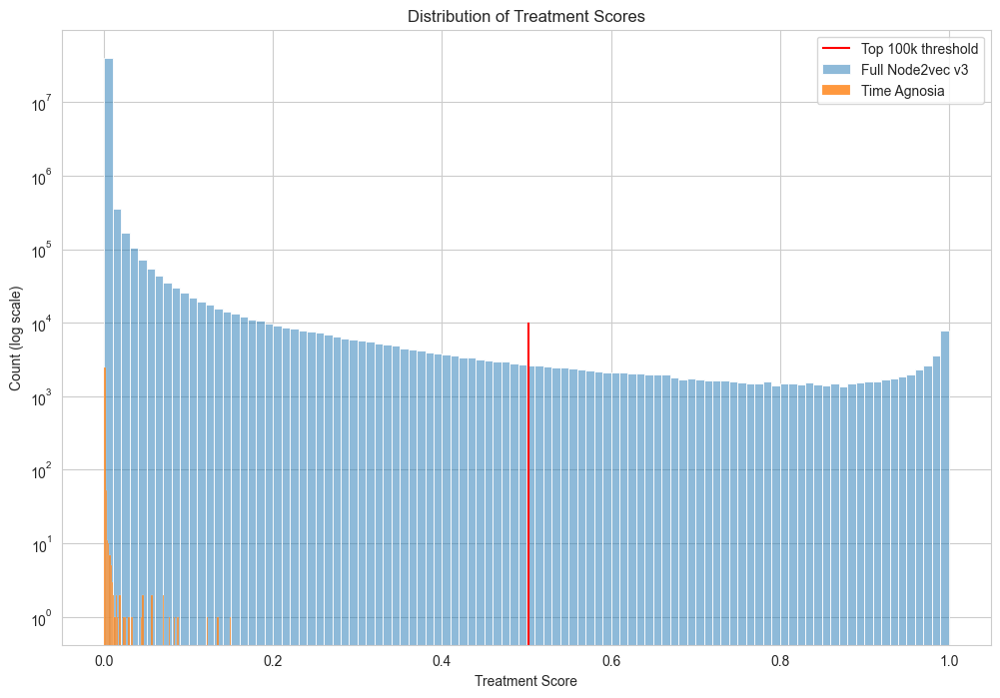

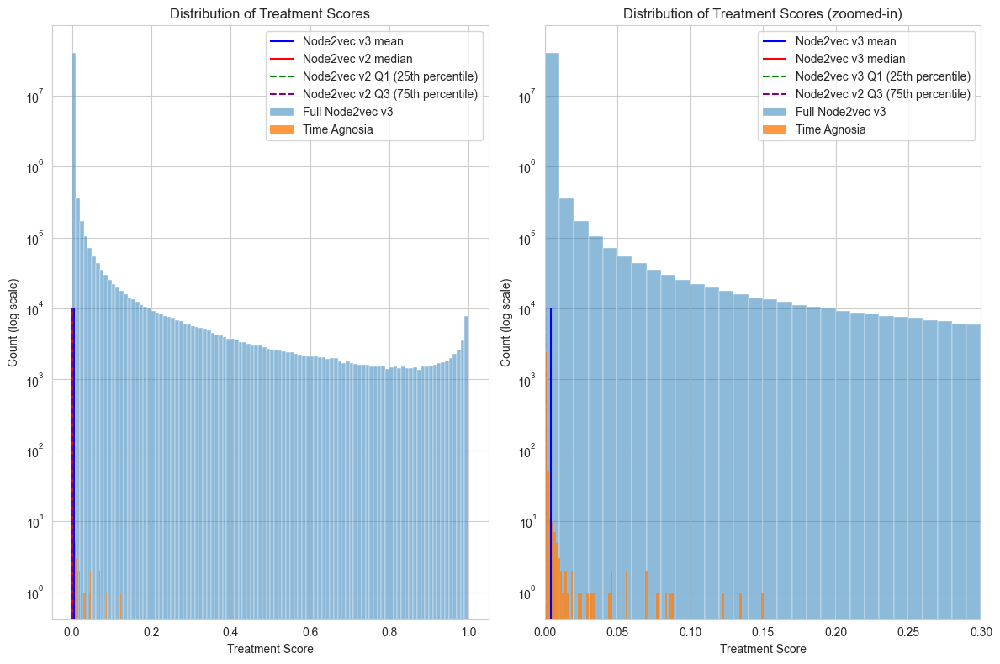

In [34]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.5)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(n2v_v3_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.5)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v3_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v3_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v3_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v3 mean')
plt.vlines(n2v_v3_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='Node2vec v2 Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.5)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v3_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v3_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v3_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v3 mean')
plt.vlines(n2v_v3_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v3 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v3 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='Node2vec v2 Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

# Node2vec p=2 q = 1
BFS-biased walk 

In [4]:
n2v_v2_matrix_scores = pd.read_parquet('gs://mtrx-us-central1-hub-dev-storage/archive/runs/old-release-silc-local-n2v-v2/07_model_output/xg_ensemble/matrix_predictions')
# SILC predictions

In [10]:
# Merge matrix scores with degree information
df_n2v_v2 = (n2v_v2_matrix_scores.groupby('target')
             .agg({'treat score': ['min', 'max', 'mean']})
             .merge(df[['id', 'degree']].rename(columns={'id': 'target'}), 
                   on='target', 
                   how='left'))

df_n2v_v2.sort_values(('treat score', 'min'), ascending=False)


/var/folders/8k/ct7ltxz14k37shrv70134t1c0000gp/T/ipykernel_2025/2521468225.py:4: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  .merge(df[['id', 'degree']].rename(columns={'id': 'target'}),


,target,"(treat score, min)","(treat score, max)","(treat score, mean)",degree
5581,MONDO:0009174,1.304062e-05,0.984721,6.620805e-02,86
2496,MONDO:0004639,1.294906e-05,0.939974,2.393342e-02,77
1564,MONDO:0003083,1.238789e-05,0.987574,4.989125e-02,58
1304,MONDO:0002520,1.219764e-05,0.938115,3.895030e-02,120
5521,MONDO:0009109,1.072131e-05,0.918244,2.812993e-02,160
...,...,...,...,...,...
10520,MONDO:0015029,3.694525e-13,0.001070,8.297951e-07,3
10522,MONDO:0015031,3.427328e-13,0.057844,3.938174e-05,6
10893,MONDO:0015690,3.024934e-13,0.002079,3.327259e-06,3
12453,MONDO:0018435,2.855245e-13,0.035031,6.990074e-05,4


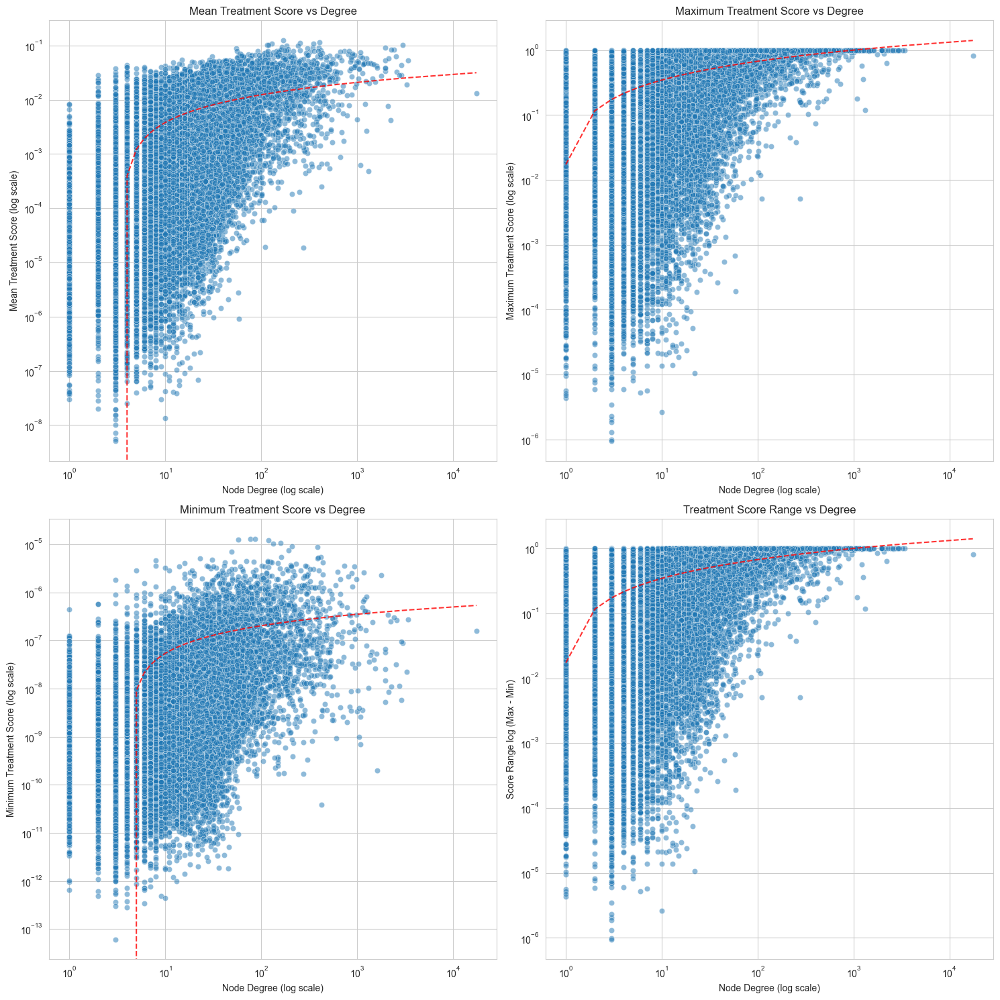

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
sns.set_style('whitegrid')

# Plot 1: Mean Score vs Degree
sns.scatterplot(data=df_n2v_v2, x='degree', y=('treat score', 'mean'), alpha=0.5, ax=axes[0,0])
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_title('Mean Treatment Score vs Degree')
axes[0,0].set_xlabel('Node Degree (log scale)')
axes[0,0].set_ylabel('Mean Treatment Score (log scale)')

# Plot 2: Max Score vs Degree
sns.scatterplot(data=df_n2v_v2, x='degree', y=('treat score', 'max'), alpha=0.5, ax=axes[0,1])
axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')
axes[0,1].set_title('Maximum Treatment Score vs Degree')
axes[0,1].set_xlabel('Node Degree (log scale)')
axes[0,1].set_ylabel('Maximum Treatment Score (log scale)')

# Plot 3: Min Score vs Degree
sns.scatterplot(data=df_n2v_v2, x='degree', y=('treat score', 'min'), alpha=0.5, ax=axes[1,0])
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_title('Minimum Treatment Score vs Degree')
axes[1,0].set_xlabel('Node Degree (log scale)')
axes[1,0].set_ylabel('Minimum Treatment Score (log scale)')

# Plot 4: Score Range (Max-Min) vs Degree
df_n2v_v2['score_range'] = df_n2v_v2[('treat score', 'max')] - df_n2v_v2[('treat score', 'min')]
sns.scatterplot(data=df_n2v_v2, x='degree', y='score_range', alpha=0.5, ax=axes[1,1])
axes[1,1].set_xscale('log')
axes[1,1].set_yscale('log')
axes[1,1].set_title('Treatment Score Range vs Degree')
axes[1,1].set_xlabel('Node Degree (log scale)')
axes[1,1].set_ylabel('Score Range log (Max - Min)')

plt.tight_layout()

# Optional: Add trend lines
for i in range(2):
    for j in range(2):
        if i == 1 and j == 1:
            y = df_n2v_v2['score_range']
        else:
            y = df_n2v_v2[('treat score', ['mean', 'max', 'min'][i*2 + j])]
        x = df_n2v_v2['degree']
        z = np.polyfit(np.log10(x), y, 1)
        p = np.poly1d(z)
        axes[i,j].plot(sorted(x), p(np.log10(sorted(x))), "r--", alpha=0.8)

Text(0.5, 0, 'Degree Percentile Bin')

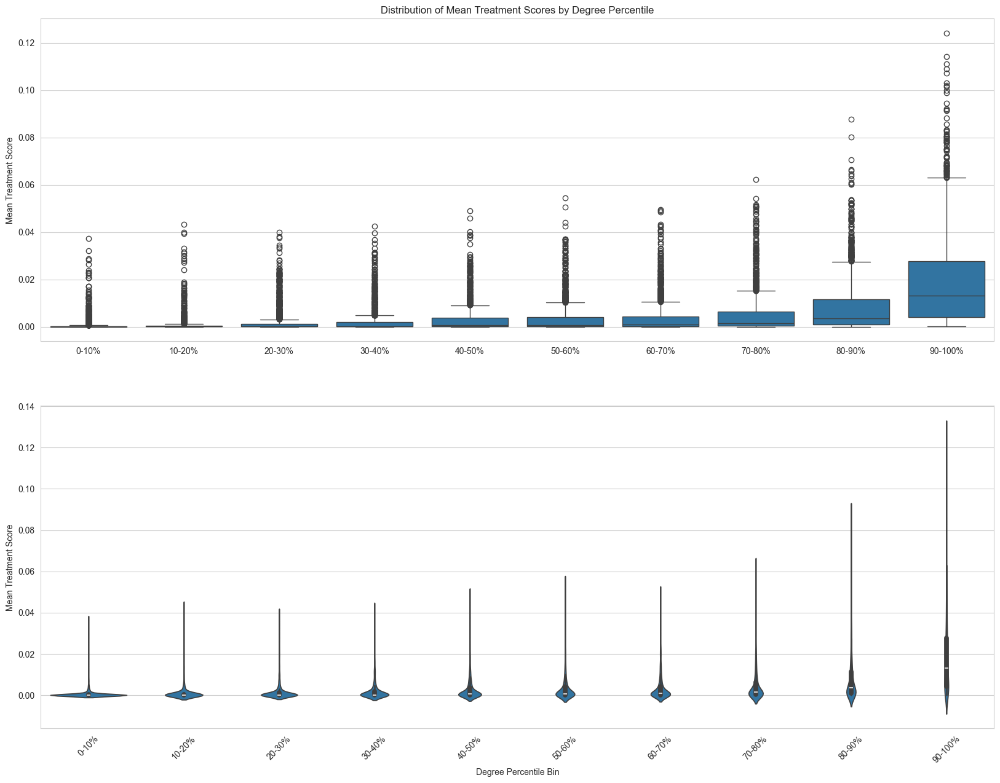

In [12]:
# 1. Box plots by degree bins
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_n2v_v2['degree_bin'] = pd.qcut(df_n2v_v2['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Mean Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v2, x='degree_bin', y=('treat score', 'mean'))
plt.xlabel('')
plt.ylabel('Mean Treatment Score')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v2, x='degree_bin', y=('treat score', 'mean'))
plt.xticks(rotation=45)
plt.ylabel('Mean Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

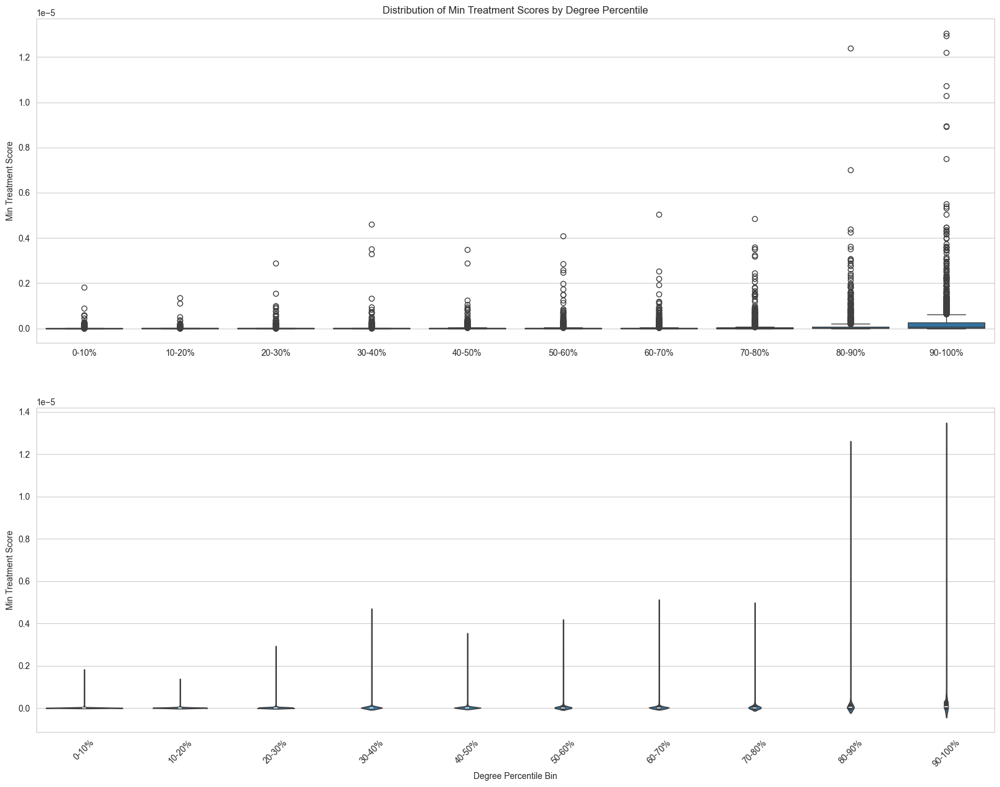

In [13]:

plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
# Create degree bins (logarithmic)
df_n2v_v2['degree_bin'] = pd.qcut(df_n2v_v2['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Min Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v2, x='degree_bin', y=('treat score', 'min'))
plt.ylabel('Min Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v2, x='degree_bin', y=('treat score', 'min'))
plt.xticks(rotation=45)
plt.ylabel('Min Treatment Score')
plt.xlabel('Degree Percentile Bin')


Text(0.5, 0, 'Degree Percentile Bin')

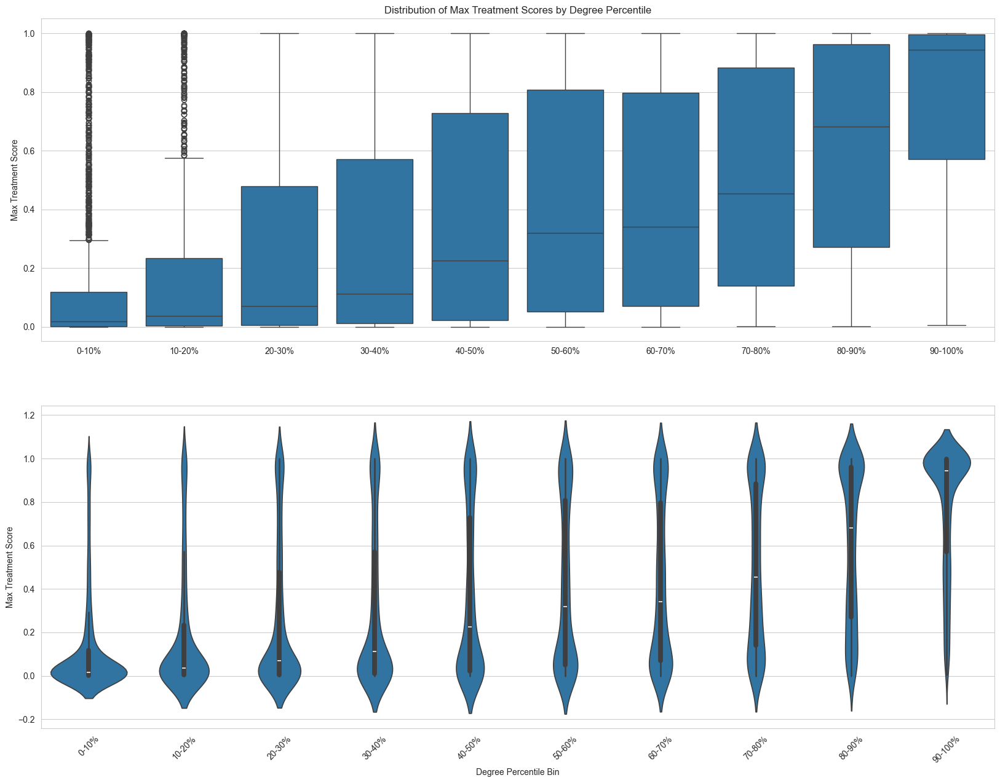

In [58]:
plt.figure(figsize=(20, 15))
plt.subplot(2,1,1)
df_n2v_v2['degree_bin'] = pd.qcut(df_n2v_v2['degree'], q=10, labels=['0-10%', '10-20%', '20-30%', '30-40%', 
                                                      '40-50%', '50-60%', '60-70%', '70-80%', 
                                                      '80-90%', '90-100%'])

# Create box plot
plt.title('Distribution of Max Treatment Scores by Degree Percentile')
sns.boxplot(data=df_n2v_v2, x='degree_bin', y=('treat score', 'max'))
plt.ylabel('Max Treatment Score')
plt.xlabel('')
plt.subplot(2,1,2)
sns.violinplot(data=df_n2v_v2, x='degree_bin', y=('treat score', 'max'))
plt.xticks(rotation=45)
plt.ylabel('Max Treatment Score')
plt.xlabel('Degree Percentile Bin')


In [69]:
# SILC comparison
excel = pd.read_excel('../scratch/repurposing_silc.xlsx', sheet_name='xg_ensemble_report_n2v_v2')
excel

,drug_id,drug_name,disease_id,disease_name,treat_score,is_known_positive,is_known_negative
0,CHEMBL.COMPOUND:CHEMBL2108737,EVABOTULINUMTOXINA,EC:8,EC:8,0.3477,False,False
1,CHEMBL.COMPOUND:CHEMBL221190,DIPHYLLIN,EC:2,EC:2,0.1226,False,False
2,CHEMBL.COMPOUND:CHEMBL1200515,DESERPIDINE,EC:6,EC:6,0.0866,False,False
3,CHEMBL.COMPOUND:CHEMBL1370561,AMINOPHYLLINE,EC:6,EC:6,0.0658,False,False
4,CHEMBL.COMPOUND:CHEMBL1200515,DESERPIDINE,EC:8,EC:8,0.0610,False,False
...,...,...,...,...,...,...,...
25625,RXNORM:992657,Hycodan,EC:4,EC:4,0.0000,False,False
25626,CHEMBL.COMPOUND:CHEMBL1200790,METHYPRYLON,EC:4,EC:4,0.0000,False,False
25627,CHEMBL.COMPOUND:CHEMBL1201163,SUFENTANIL CITRATE,EC:4,EC:4,0.0000,False,False
25628,CHEMBL.COMPOUND:CHEMBL1200425,PARGYLINE HYDROCHLORIDE,EC:4,EC:4,0.0000,False,False


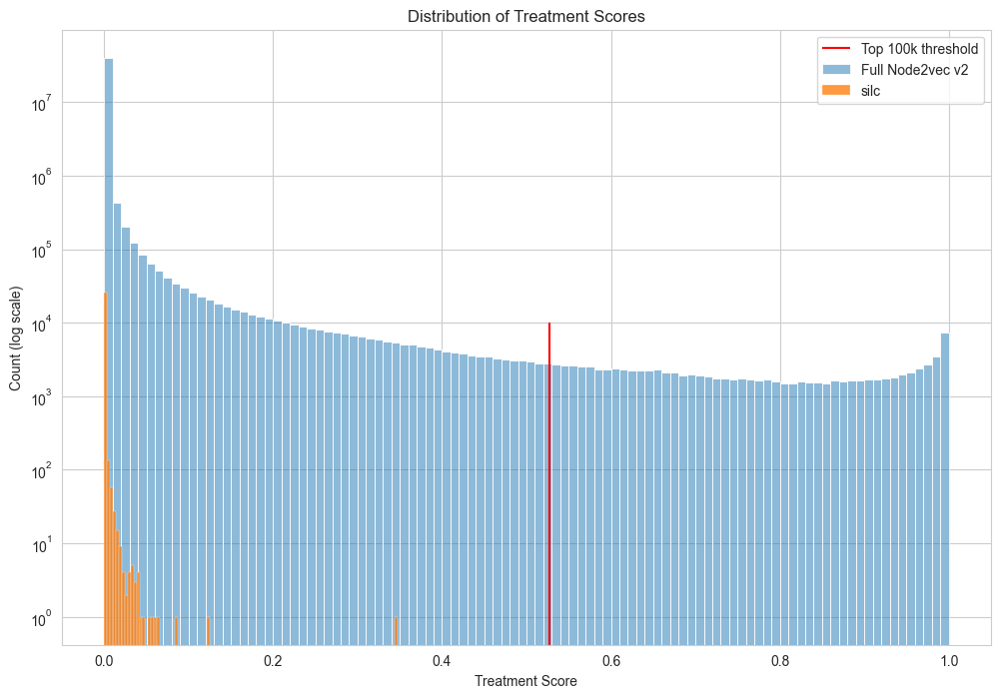

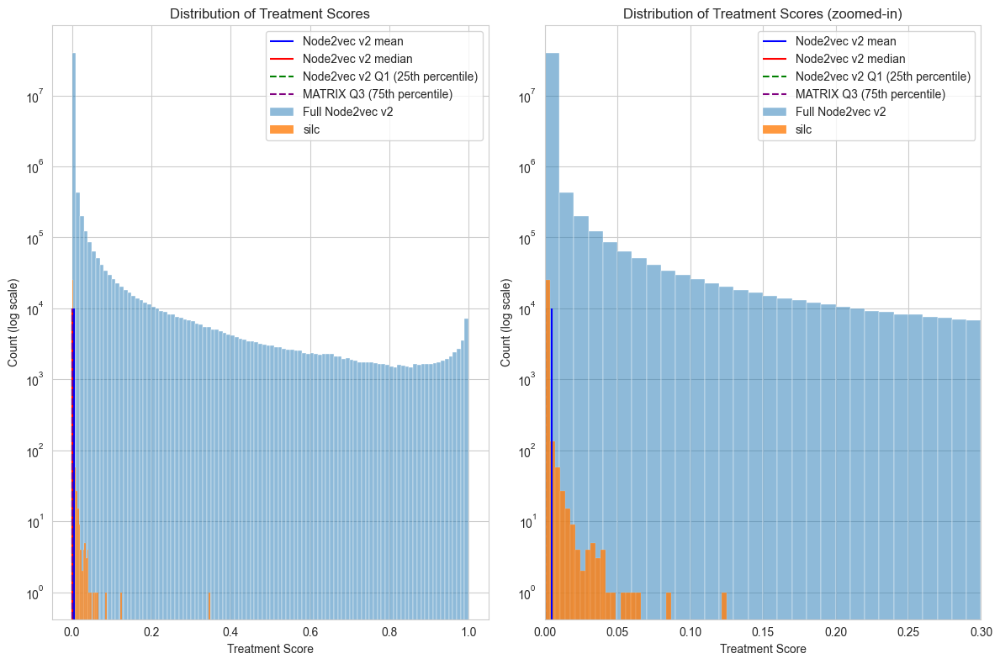

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.5)
sns.histplot(data=excel, x='treat_score', bins=100, label='silc', alpha=0.8)
plt.vlines(n2v_v2_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.5)
sns.histplot(data=excel, x='treat_score', bins=100, label='silc', alpha=0.8)

q25 = n2v_v2_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v2_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v2_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v2 mean')
plt.vlines(n2v_v2_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.5)
sns.histplot(data=excel, x='treat_score', bins=100, label='silc', alpha=0.8)

q25 = n2v_v2_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v2_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v2_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v2 mean')
plt.vlines(n2v_v2_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='MATRIX Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

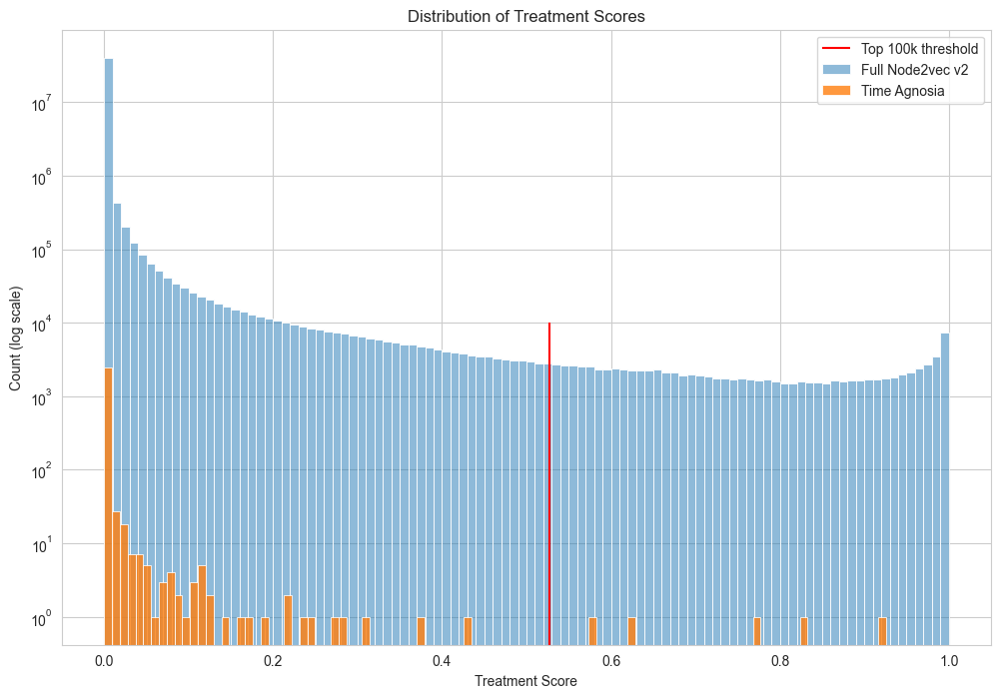

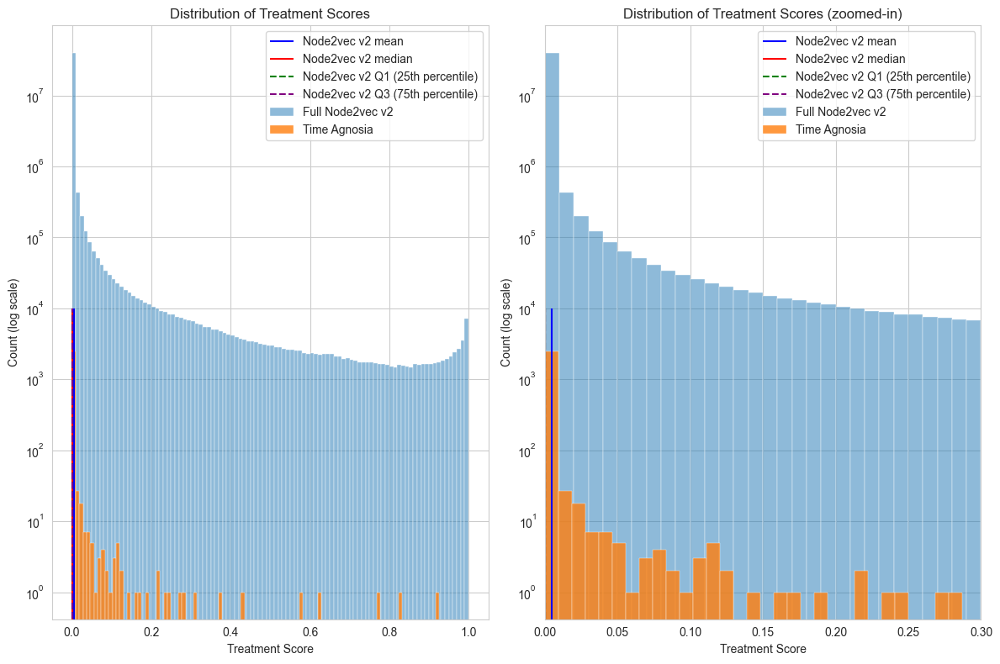

In [17]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.5)
sns.histplot(data=n2v_v2_matrix_scores.loc[n2v_v2_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)
plt.vlines(n2v_v2_matrix_scores['treat score'].head(100000).values[-1], 0, 10000, color='red', label='Top 100k threshold')
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.5)
sns.histplot(data=n2v_v2_matrix_scores.loc[n2v_v2_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v2_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v2_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v2_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v2 mean')
plt.vlines(n2v_v2_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='Node2vec v2 Q3 (75th percentile)')

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()

# Adjust layout to prevent label cutoff
plt.subplot(1,2,2)

# Create the plot
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.5)
sns.histplot(data=n2v_v2_matrix_scores.loc[n2v_v2_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Time Agnosia', alpha=0.8)

q25 = n2v_v2_matrix_scores['treat score'].quantile(0.25)
q75 = n2v_v2_matrix_scores['treat score'].quantile(0.75)
# Customize the plot
plt.vlines(n2v_v2_matrix_scores['treat score'].mean(), 0, 10000, color='blue', label='Node2vec v2 mean')
plt.vlines(n2v_v2_matrix_scores['treat score'].median(), 0, 10000, color='red', label='Node2vec v2 median')
plt.vlines(q25, 0, 10000, color='green', linestyle='--', label='Node2vec v2 Q1 (25th percentile)')
plt.vlines(q75, 0, 10000, color='purple', linestyle='--', label='Node2vec v2 Q3 (75th percentile)')
plt.xlim(0,0.3)

plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores (zoomed-in)')
plt.legend()
plt.tight_layout()

# Node2Vec Bias comparison

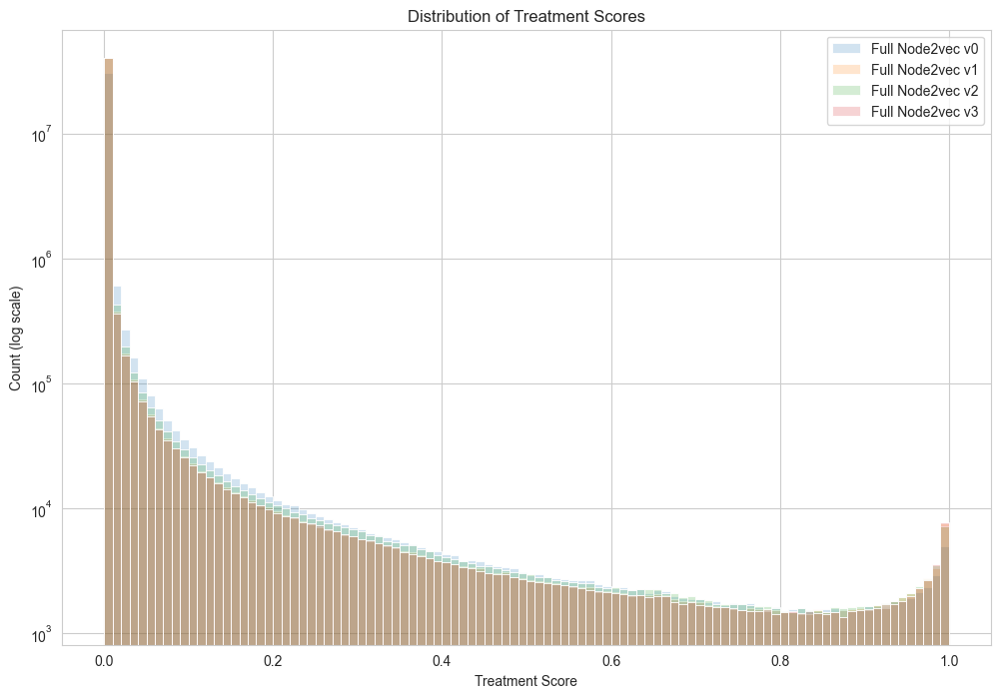

In [54]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores, x='treat score', bins=100, label='Full Node2vec v0', alpha=0.2)
sns.histplot(data=n2v_v1_matrix_scores, x='treat score', bins=100, label='Full Node2vec v1', alpha=0.2)
sns.histplot(data=n2v_v2_matrix_scores, x='treat score', bins=100, label='Full Node2vec v2', alpha=0.2)
sns.histplot(data=n2v_v3_matrix_scores, x='treat score', bins=100, label='Full Node2vec v3', alpha=0.2)
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()
sns.set_style('whitegrid')



Conclusion: On a large matrix scale, Biased random walk is not really affecting the downstream models. , regardless of whether we focus on return factor or in_out factor, is not actually improving the scores for a sparse SILC graph. Furthermore, biasing the n2v has not really affected the performance of SILC model

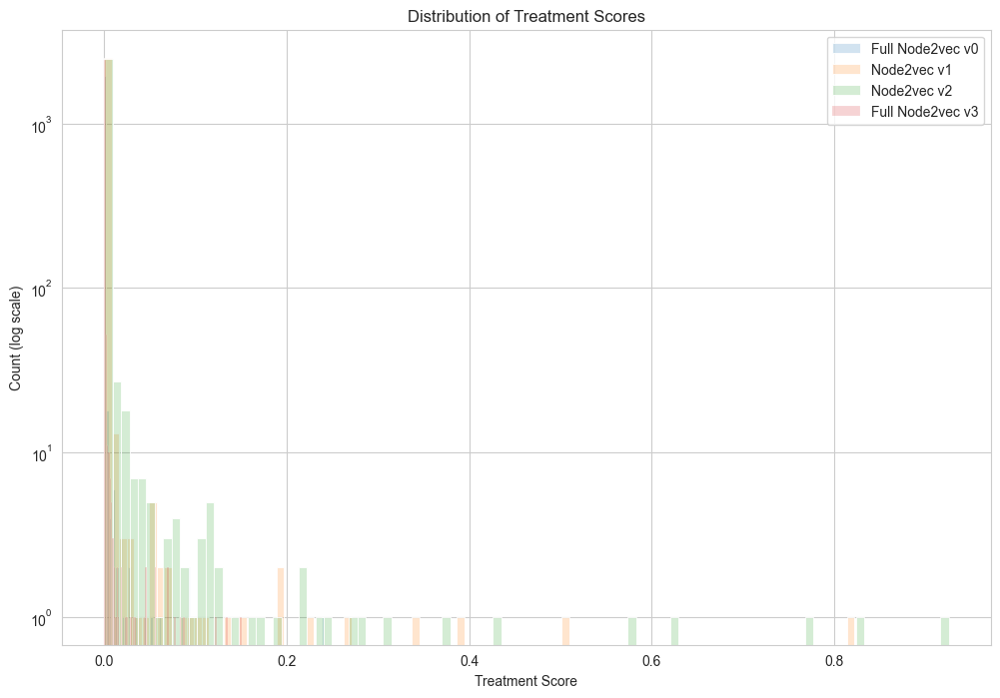

In [55]:

import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Full Node2vec v0', alpha=0.2)
sns.histplot(data=n2v_v1_matrix_scores.loc[n2v_v1_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Node2vec v1', alpha=0.2)
sns.histplot(data=n2v_v2_matrix_scores.loc[n2v_v2_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Node2vec v2', alpha=0.2)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0015694'], x='treat score', bins=100, label='Full Node2vec v3', alpha=0.2)
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()



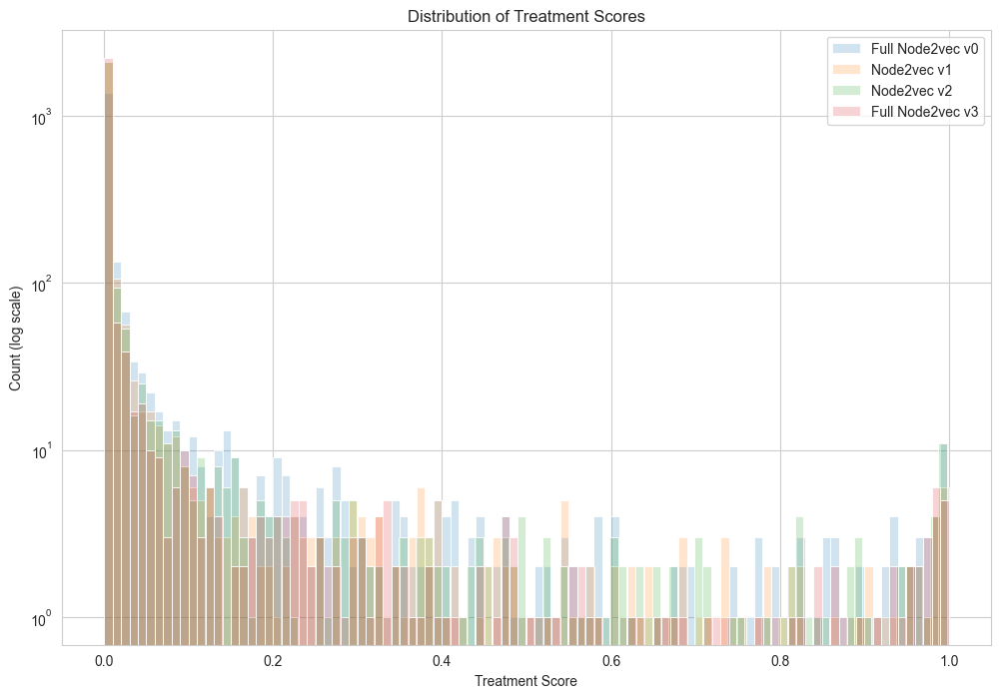

In [56]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='Full Node2vec v0', alpha=0.2)
sns.histplot(data=n2v_v1_matrix_scores.loc[n2v_v1_matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='Node2vec v1', alpha=0.2)
sns.histplot(data=n2v_v2_matrix_scores.loc[n2v_v2_matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='Node2vec v2', alpha=0.2)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0005258'], x='treat score', bins=100, label='Full Node2vec v3', alpha=0.2)
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


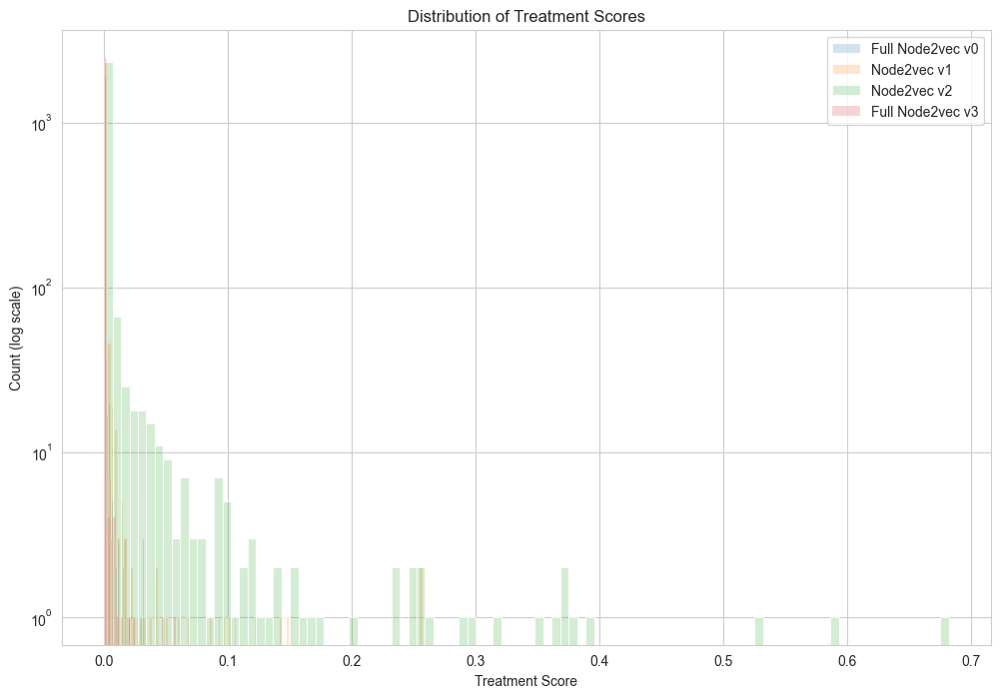

In [57]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=matrix_scores.loc[matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Full Node2vec v0', alpha=0.2)
sns.histplot(data=n2v_v1_matrix_scores.loc[n2v_v1_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Node2vec v1', alpha=0.2)
sns.histplot(data=n2v_v2_matrix_scores.loc[n2v_v2_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Node2vec v2', alpha=0.2)
sns.histplot(data=n2v_v3_matrix_scores.loc[n2v_v3_matrix_scores.target=='MONDO:0011305'], x='treat score', bins=100, label='Full Node2vec v3', alpha=0.2)
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


## SILC comparison


In [71]:
excel_v2 = pd.read_excel('../scratch/repurposing_silc.xlsx', sheet_name='xg_ensemble_report_n2v_v2')
excel_v3 = pd.read_excel('../scratch/repurposing_silc.xlsx', sheet_name='xg_ensemble_report_n2v_v3')
excel_v1 = pd.read_excel('../scratch/repurposing_silc.xlsx', sheet_name='xg_ensemble_report_n2v_v1')
silc_full = pd.read_excel(f'../scratch/silc_november/old_release_cumulative_subtypes_silc_node2vec.xlsx')

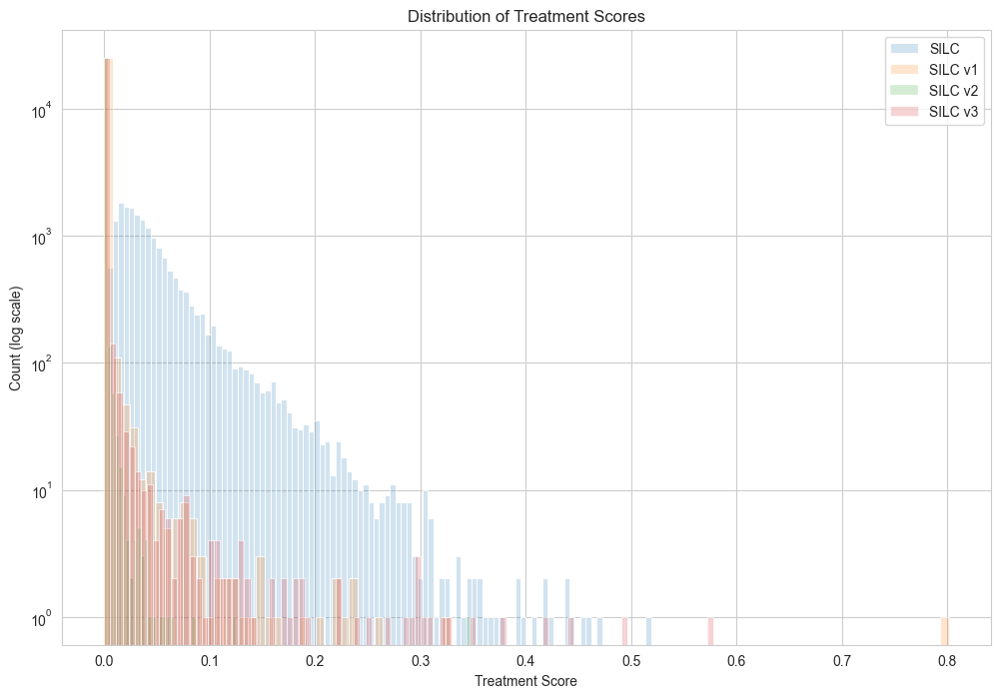

In [72]:


import seaborn as sns
import matplotlib.pyplot as plt

# Set the style and figure size
plt.figure(figsize=(12, 8))
sns.set_style('whitegrid')

# Create the plot
sns.histplot(data=silc_full, x='treat_score', bins=100, label='SILC v0', alpha=0.2)
sns.histplot(data=excel_v1, x='treat_score', bins=100, label='SILC v1', alpha=0.2)
sns.histplot(data=excel_v2, x='treat_score', bins=100, label='SILC v2', alpha=0.2)
sns.histplot(data=excel_v3, x='treat_score', bins=100, label='SILC v3', alpha=0.2)
plt.yscale('log')
plt.xlabel('Treatment Score')
plt.ylabel('Count (log scale)')
plt.title('Distribution of Treatment Scores')
plt.legend()


Conclusion: Biased random walk, regardless of whether we focus on return factor or in_out factor, is not actually improving the scores for a sparse SILC graph. Furthermore, biasing the n2v has not really affected the performance of SILC model